In [1]:
# EDA methodology adapted from
# https://www.analyticsvidhya.com/blog/2022/07/step-by-step-exploratory-data-analysis-eda-using-python/

# -------------------------------------
# Library configurationf
# -------------------------------------

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Lucky number
random_state = 8

# Define seaborn styles
colors = sns.color_palette("pastel")
sns.set_theme(style="white") # https://stackoverflow.com/questions/25238442/setting-plot-background-colour-in-seaborn

In [3]:
# Loading dataset
dataset = pd.read_csv('data/cs199_data.csv')

dataset.head()

,SAMPLEID,6_ANSWERDATE,6_SEX,6_AGE,6_AGEID,6_PREFECTURE,6_AREA,6_MARRIED,6_CHILD,6_HINCOME,...,6_Mental_group,6_Covid_group,6_K6_group3,6_K6_group2,6_PHQ9_%,6_GAD_%,6_PHQ9_item9,6_PHQ9_SI,6_LSNS_group,6_AUDIT_group
0,1106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1759,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1916,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3474,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3793,5-13-2024,1.0,57.0,10.0,40.0,8.0,2.0,2.0,4.0,...,4.0,4.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,0.0


In [4]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24050 entries, 0 to 24049
Columns: 114 entries, SAMPLEID to 6_AUDIT_group
dtypes: float64(109), int64(1), object(4)
memory usage: 20.9+ MB


In [5]:
dataset.nunique()

SAMPLEID         24050
6_ANSWERDATE         8
6_SEX                2
6_AGE               69
6_AGEID              9
                 ...  
6_GAD_%              2
6_PHQ9_item9         4
6_PHQ9_SI            2
6_LSNS_group         2
6_AUDIT_group        3
Length: 114, dtype: int64

In [6]:
dataset.isnull().sum()

SAMPLEID             0
6_ANSWERDATE     21391
6_SEX            21391
6_AGE            21391
6_AGEID          21391
                 ...  
6_GAD_%          21391
6_PHQ9_item9     21391
6_PHQ9_SI        21391
6_LSNS_group     21391
6_AUDIT_group    21391
Length: 114, dtype: int64

In [7]:
dataset.isnull().sum()

SAMPLEID             0
6_ANSWERDATE     21391
6_SEX            21391
6_AGE            21391
6_AGEID          21391
                 ...  
6_GAD_%          21391
6_PHQ9_item9     21391
6_PHQ9_SI        21391
6_LSNS_group     21391
6_AUDIT_group    21391
Length: 114, dtype: int64

In [8]:
# Check for duplicates on each row.
dataset.duplicated().value_counts()

False    24050
Name: count, dtype: int64

In [9]:
# Code snippet to help us see the percentage of missing values per column
(dataset.isnull().sum()/(len(dataset)))*100

SAMPLEID          0.000000
6_ANSWERDATE     88.943867
6_SEX            88.943867
6_AGE            88.943867
6_AGEID          88.943867
                   ...    
6_GAD_%          88.943867
6_PHQ9_item9     88.943867
6_PHQ9_SI        88.943867
6_LSNS_group     88.943867
6_AUDIT_group    88.943867
Length: 114, dtype: float64

In [10]:
columns  = dataset.columns

for column in columns:
    print(column)

SAMPLEID
6_ANSWERDATE
6_SEX
6_AGE
6_AGEID
6_PREFECTURE
6_AREA
6_MARRIED
6_CHILD
6_HINCOME
6_PINCOME
6_JOB
6_STUDENT
6_Number_fam
6_SchoolGrade
6_YearsEnrolled
6_VacNum
6_Med_self
6_Medself_covid
6_Med_fam
6_Medfam_covid
6_Current_physical
6_Past_physical
6_Current_mental
6_Past_mental
6_Current_covid19
6_Past_covid19
6_Exercise
6_HealthyDiet
6_FavoriteActivity
6_Interaction_offline
6_Interaction_online
6_PB_Continuous
6_PB_Altruistic
6_PB_Avoidant
6_Trust_gov
6_Trust_SM
6_Vaccination_will
6_PB_understanding
6_Optimism
6_HealthySleep
6_DeteriorationEconomy
6_DeteriorationInteract
6_Frustration
6_CovidAnxiety
6_CovidSleepless
6_DifficultyLiving
6_DifficultyWork
6_PTG1_S22
6_PTG2_S23
6_PTG3_S24
6_PTG4_S25
6_PTG5_S_26
6_PTG6_S27
6_Social_Capital_Q8S1
6_Social_Capital_Q8S2
6_Social_Capital_Q8S3
6_Social_Capital_Q8S4
6_Social_Capital_Q8S5
6_Social_Capital_Q9S1
6_Social_Capital_Q9S2
6_Social_Capital_Q9S3
6_Social_Capital_Q10S1_1
6_Social_Capital_Q10S1_2
6_Social_Capital_Q10S1_3
6_Social_Capit

In [11]:
# Sorting dataset based on SAMPLEID
dataset_sorted = dataset.sort_values(by=['SAMPLEID'])

In [12]:
initial_rows = len(dataset_sorted)
dataset_cleaned = dataset_sorted.dropna().dropna(subset=['6_PINCOME', '6_HINCOME'])
final_rows = len(dataset_cleaned)
print(f"Number of rows dropped: {initial_rows - final_rows}")

Number of rows dropped: 21391


In [13]:
# Gathering columns
column_names = dataset_cleaned.columns.tolist()

# Displaying column names
column_names

['SAMPLEID',
 '6_ANSWERDATE',
 '6_SEX',
 '6_AGE',
 '6_AGEID',
 '6_PREFECTURE',
 '6_AREA',
 '6_MARRIED',
 '6_CHILD',
 '6_HINCOME',
 '6_PINCOME',
 '6_JOB',
 '6_STUDENT',
 '6_Number_fam',
 '6_SchoolGrade',
 '6_YearsEnrolled',
 '6_VacNum',
 '6_Med_self',
 '6_Medself_covid',
 '6_Med_fam',
 '6_Medfam_covid',
 '6_Current_physical',
 '6_Past_physical',
 '6_Current_mental',
 '6_Past_mental',
 '6_Current_covid19',
 '6_Past_covid19',
 '6_Exercise',
 '6_HealthyDiet',
 '6_FavoriteActivity',
 '6_Interaction_offline',
 '6_Interaction_online',
 '6_PB_Continuous',
 '6_PB_Altruistic',
 '6_PB_Avoidant',
 '6_Trust_gov',
 '6_Trust_SM',
 '6_Vaccination_will',
 '6_PB_understanding',
 '6_Optimism',
 '6_HealthySleep',
 '6_DeteriorationEconomy',
 '6_DeteriorationInteract',
 '6_Frustration',
 '6_CovidAnxiety',
 '6_CovidSleepless',
 '6_DifficultyLiving',
 '6_DifficultyWork',
 '6_PTG1_S22',
 '6_PTG2_S23',
 '6_PTG3_S24',
 '6_PTG4_S25',
 '6_PTG5_S_26',
 '6_PTG6_S27',
 '6_Social_Capital_Q8S1',
 '6_Social_Capital_Q8S2

In [14]:
df_wilcoxon = pd.read_csv('data/dataset_differences.csv')
df_wilcoxon.head()

,SAMPLEID,K6_total_old,PHQ9_total_old,GAD7_total_old,SSS8_total_old,PTGI-X(Q7_22_27)_old,SHS_total_old,UCLA_total_old,LSNS6_total_old,AUDIT_old,...,AUDIT_new,K6_total_diff,PHQ9_total_diff,GAD7_total_diff,SSS8_total_diff,PTGI-X(Q7_22_27)_diff,SHS_total_diff,UCLA_total_diff,LSNS6_total_diff,AUDIT_diff
0,3793,4.0,5.0,4.0,13.0,0.0,1.50,40.0,4.0,4.0,...,6,8.0,10.0,10.0,5.0,19.0,2.50,-16.0,0.0,2.0
1,9703,0.0,0.0,0.0,1.0,7.0,4.00,10.0,17.0,0.0,...,0,1.0,0.0,0.0,0.0,-4.0,0.50,1.0,1.0,0.0
2,11532,24.0,0.0,0.0,4.0,0.0,4.50,31.0,4.0,0.0,...,0,-23.0,2.0,0.0,-3.0,0.0,-0.50,1.0,-4.0,0.0
3,15778,0.0,0.0,0.0,0.0,13.0,5.25,16.0,15.0,0.0,...,0,0.0,0.0,0.0,0.0,5.0,0.25,5.0,-2.0,0.0
4,18713,0.0,0.0,0.0,0.0,18.0,5.00,23.0,5.0,0.0,...,0,0.0,2.0,0.0,0.0,-3.0,0.25,-1.0,13.0,0.0


In [15]:
#  ucla
X = np.array(df_wilcoxon.UCLA_total_old)
Y = np.array(df_wilcoxon.UCLA_total_new)
res = stats.wilcoxon(X, Y, alternative='two-sided')
res

WilcoxonResult(statistic=np.float64(1105938.0), pvalue=np.float64(4.0303484027415785e-08))

In [16]:
#  ucla
X = np.array(df_wilcoxon.UCLA_total_old)
Y = np.array(df_wilcoxon.UCLA_total_new)
res = stats.wilcoxon(X, Y, alternative='greater')
res

WilcoxonResult(statistic=np.float64(1444473.0), pvalue=np.float64(2.0151742013707893e-08))

In [17]:
#  ucla
X = np.array(df_wilcoxon.UCLA_total_old)
Y = np.array(df_wilcoxon.UCLA_total_new)
res = stats.wilcoxon(X, Y, alternative='less')
res

WilcoxonResult(statistic=np.float64(1444473.0), pvalue=np.float64(0.999999979848258))

In [18]:
# Setting attributes
# Dropping Prefecture, Student, and PTG subscales
# as per Nunez 2022

# removed targets as well from attributes

# Setting attributes
dataset_cleaned = dataset_cleaned[[
 '6_SEX', # 1 Male, 2 Femail
 '6_AGE',
 '6_MARRIED', # 1 unmarried, 2 married
 '6_JOB', # 1 civil servant, 2 management and officers, 3 company employee (clerical), 4 company employee (technical, 5 (company empolyee (other), 6 self-employed, 7 freelance, 8 full-time housewife (househusband), 9 part-time workers, 10 students, 11 others, 12 unemployed
 '6_HINCOME',


 '6_Exercise', # i tried to exercise for my health (both indoors and outdoors) - 1 notapplicable - 7 very applicable
 '6_HealthyDiet', # i ate with a nutritional balance in mind - 1 not applicable - 7 very applicable
 '6_HealthySleep', #
 '6_Interaction_offline',
 '6_Interaction_online',
 '6_DeteriorationEconomy', # economic situation worsened
 '6_DeteriorationInteract', # interpersonal relationships with close people such as family and friends deteroirated
 '6_Frustration',
 '6_CovidAnxiety',
 '6_CovidSleepless',
 '6_DifficultyLiving',
 '6_DifficultyWork',


 '6_K6_total', #ok
 '6_PHQ9_total', #ok
 '6_SSS8_total', #ok
 '6_UCLA_total', #ok
 '6_LSNS6_total' ]] #ok

In [19]:
# drop those who don't know their household income
initial_rows = len(dataset_cleaned)
dataset_cleaned = dataset_cleaned.drop(dataset_cleaned[dataset_cleaned["6_HINCOME"] == 10].index)
final_rows = len(dataset_cleaned)
print(f"Number of rows dropped: {initial_rows - final_rows}")

Number of rows dropped: 256


In [20]:
# drop those who don't know their household income
initial_rows = len(dataset_cleaned)
dataset_cleaned = dataset_cleaned.drop(dataset_cleaned[dataset_cleaned["6_HINCOME"] == 0].index)
final_rows = len(dataset_cleaned)
print(f"Number of rows dropped: {initial_rows - final_rows}")

Number of rows dropped: 189


In [21]:
dataset_cleaned.nunique()

6_SEX                       2
6_AGE                      68
6_MARRIED                   2
6_JOB                      12
6_HINCOME                   9
6_Exercise                  7
6_HealthyDiet               7
6_HealthySleep              7
6_Interaction_offline       7
6_Interaction_online        7
6_DeteriorationEconomy      7
6_DeteriorationInteract     7
6_Frustration               7
6_CovidAnxiety              7
6_CovidSleepless            7
6_DifficultyLiving          7
6_DifficultyWork            7
6_K6_total                 25
6_PHQ9_total               28
6_SSS8_total               32
6_UCLA_total               31
6_LSNS6_total              31
dtype: int64

In [22]:
unique_values = dataset_cleaned["6_HINCOME"].unique()
print(f"Unique values in 6_HINCOME: {unique_values}")


Unique values in 6_HINCOME: [4. 7. 3. 2. 8. 1. 5. 6. 9.]


In [23]:
df = dataset_cleaned.copy()
df.head

<bound method NDFrame.head of        6_SEX  6_AGE  6_MARRIED  6_JOB  6_HINCOME  6_Exercise  6_HealthyDiet  \
4        1.0   57.0        2.0    4.0        4.0         5.0            4.0   
8        2.0   70.0        2.0    8.0        7.0         1.0            6.0   
11       1.0   52.0        1.0    3.0        3.0         2.0            3.0   
15       1.0   66.0        2.0    3.0        4.0         6.0            5.0   
19       1.0   63.0        2.0    2.0        7.0         1.0            2.0   
...      ...    ...        ...    ...        ...         ...            ...   
11204    1.0   57.0        2.0    3.0        2.0         5.0            5.0   
11208    1.0   55.0        2.0    3.0        7.0         2.0            7.0   
11209    2.0   50.0        2.0    8.0        5.0         3.0            4.0   
11288    2.0   33.0        1.0    3.0        4.0         5.0            4.0   
11300    1.0   46.0        2.0    3.0        4.0         2.0            4.0   

       6_HealthySleep

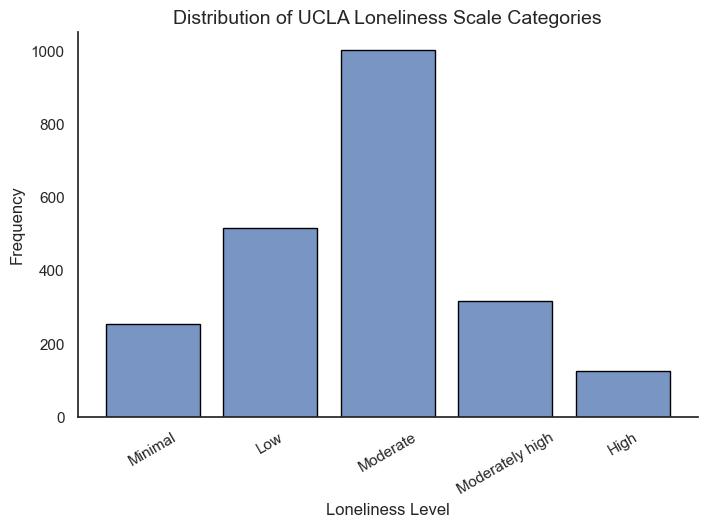

In [24]:
# https://seaborn.pydata.org/generated/seaborn.histplot.html
# seaborn histplot

# categorical order
# https://stackoverflow.com/questions/67205522/set-order-on-sns-histplot

# UCLA-LS3 has been used
# the score ranges have been adjusted to fit 10-40 range instead of 0-80

column = '6_UCLA_total'

## UCLA Dataset
# Declaring function for UCLA Loneliness Scale (UCLA LS)
def ucla_ls_categories(x):
    if 10 <= x <= 15:
        return 'Minimal'
    elif 16 <= x <= 21:
        return 'Low'
    elif 22 <= x <= 27:
        return 'Moderate'
    elif 28 <= x <= 33:
        return 'Moderately high'
    elif 34 <= x <= 40:
        return 'High'
    
# Transform columns in categorical descriptions
dataset_cleaned[column] = dataset_cleaned[column].apply(ucla_ls_categories)

# Category order
category_order = ['Minimal', 'Low', 'Moderate', 'Moderately high', 'High']

dataset_cleaned[column] = pd.Categorical(dataset_cleaned[column], categories=category_order)

# Create histogram
plt.figure(figsize=(8, 5))
ax = sns.histplot(data=dataset_cleaned, 
                  x=column, 
                  discrete=True, 
                  shrink=0.8, 
                  palette=colors, 
                  edgecolor="black")

# Show histogram
plt.xlabel("Loneliness Level", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of UCLA Loneliness Scale Categories", fontsize=14)
plt.xticks(rotation=30)
sns.despine()
plt.show()

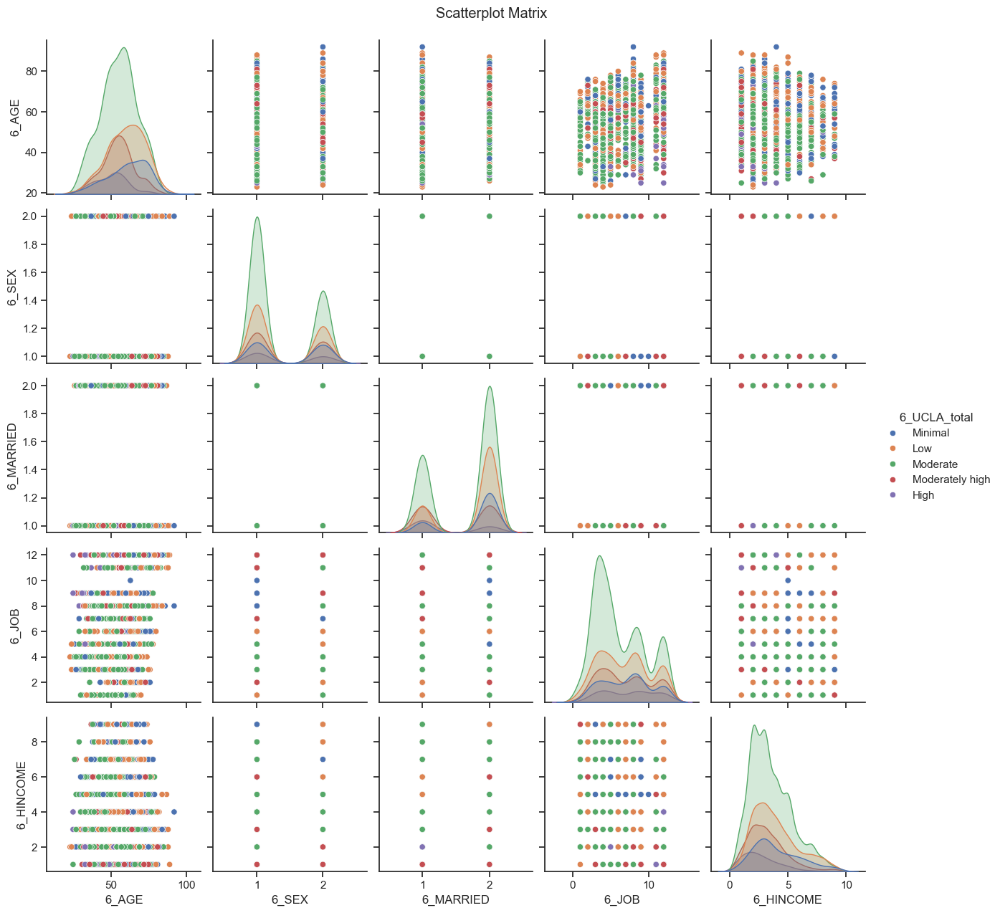

In [25]:
# https://seaborn.pydata.org/examples/scatterplot_matrix.html
# Scatterplot Matrix
sns.set_theme(style="ticks")
scatterplot_columns = ['6_AGE', '6_SEX', '6_MARRIED', '6_JOB', '6_HINCOME', '6_UCLA_total']
sns.pairplot(dataset_cleaned[scatterplot_columns], hue="6_UCLA_total")
plt.suptitle("Scatterplot Matrix", y=1.02)
plt.show()

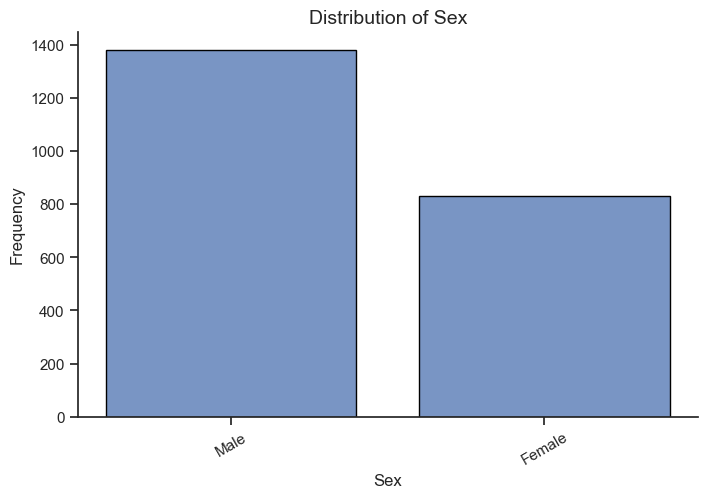

In [26]:
column = '6_SEX'

def sex_categories(x):
    if x == 1:
        return 'Male'
    else:
        return 'Female'
    
# Transform columns in categorical descriptions
dataset_cleaned[column] = dataset_cleaned[column].apply(sex_categories)

# Category order
category_order = ['Male', 'Female']

dataset_cleaned[column] = pd.Categorical(dataset_cleaned[column], categories=category_order)

# Create histogram
plt.figure(figsize=(8, 5))
ax = sns.histplot(data=dataset_cleaned, 
                  x=column, 
                  discrete=True, 
                  shrink=0.8, 
                  palette=colors, 
                  edgecolor="black")

# Show histogram
plt.xlabel("Sex", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of Sex", fontsize=14)
plt.xticks(rotation=30)
sns.despine()
plt.show()

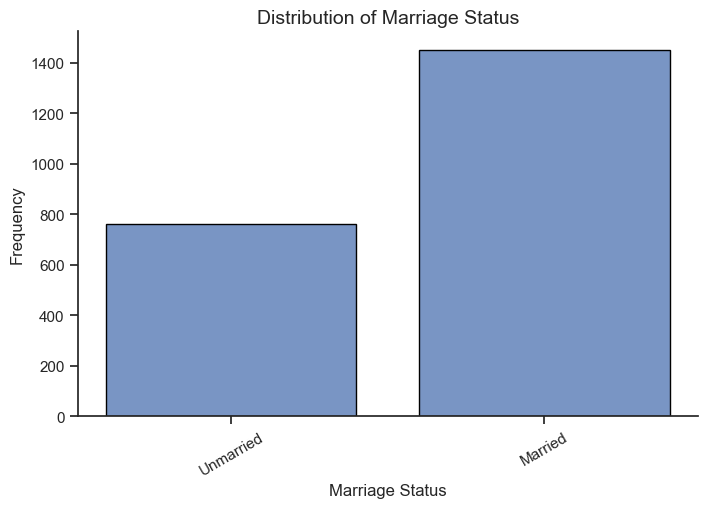

In [27]:
column = '6_MARRIED'

def married_categories(x):
    if x == 1:
        return 'Unmarried'
    else:
        return 'Married'
    
# Transform columns in categorical descriptions
dataset_cleaned[column] = dataset_cleaned[column].apply(married_categories)

# Category order
category_order = ['Unmarried', 'Married']

dataset_cleaned[column] = pd.Categorical(dataset_cleaned[column], categories=category_order)

# Create histogram
plt.figure(figsize=(8, 5))
ax = sns.histplot(data=dataset_cleaned, 
                  x=column, 
                  discrete=True, 
                  shrink=0.8, 
                  palette=colors, 
                  edgecolor="black")

# Show histogram
plt.xlabel("Marriage Status", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of Marriage Status", fontsize=14)
plt.xticks(rotation=30)
sns.despine()
plt.show()

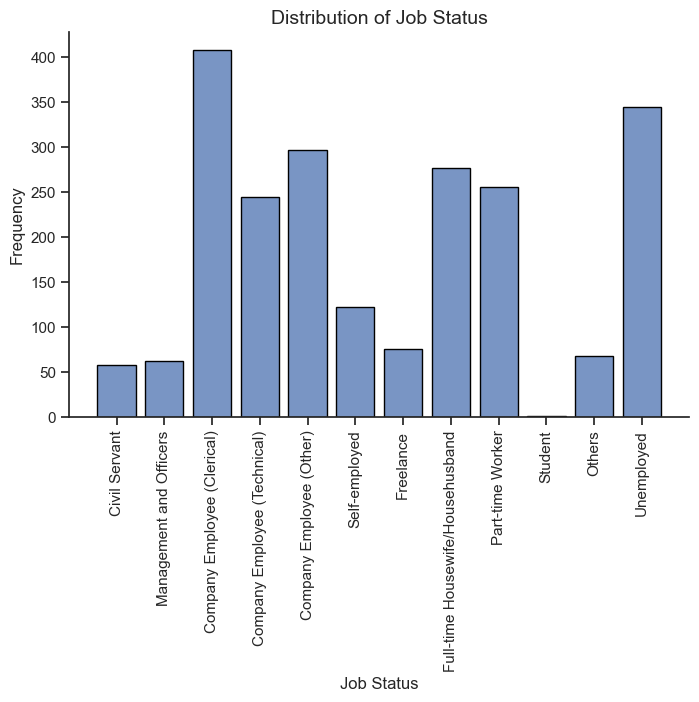

In [28]:
column = '6_JOB'

def job_categories(x):
    if x == 1:
        return 'Civil Servant'
    elif x == 2:
        return 'Management and Officers'
    elif x == 3:
        return 'Company Employee (Clerical)'
    elif x == 4: 
        return 'Company Employee (Technical)'
    elif x == 5:
        return 'Company Employee (Other)'
    elif x == 6:
        return 'Self-employed'
    elif x == 7:
        return 'Freelance'
    elif x == 8:
        return 'Full-time Housewife/Househusband'
    elif x == 9:
        return 'Part-time Worker'
    elif x == 10:
        return 'Student'
    elif x == 11:
        return 'Others'
    else:
        return 'Unemployed'
    
# Transform columns in categorical descriptions
dataset_cleaned[column] = dataset_cleaned[column].apply(job_categories)

# Category order
category_order = [
'Civil Servant', 
'Management and Officers', 
'Company Employee (Clerical)', 
'Company Employee (Technical)', 
'Company Employee (Other)', 
'Self-employed',
'Freelance',
'Full-time Housewife/Househusband',
'Part-time Worker',
'Student',
'Others',
'Unemployed'
]

dataset_cleaned[column] = pd.Categorical(dataset_cleaned[column], categories=category_order)

# Create histogram
plt.figure(figsize=(8, 5))
ax = sns.histplot(data=dataset_cleaned, 
                  x=column, 
                  discrete=True, 
                  shrink=0.8, 
                  palette=colors, 
                  edgecolor="black")

# Show histogram
plt.xlabel("Job Status", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of Job Status", fontsize=14)
plt.xticks(rotation=90)
sns.despine()
plt.show()

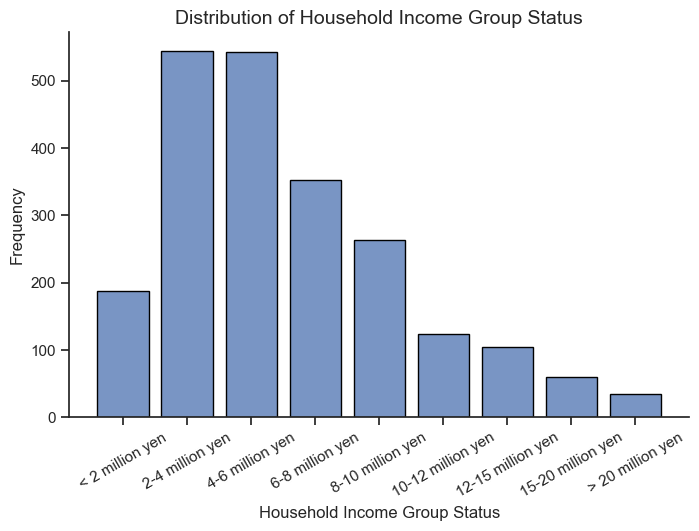

In [29]:
column = '6_HINCOME'

def hincome_group_categories(x):
    if x == 1:
        return '< 2 million yen'
    elif x == 2:
        return '2-4 million yen'
    elif x == 3:
        return '4-6 million yen'
    elif x == 4: 
        return '6-8 million yen'
    elif x == 5:
        return '8-10 million yen'
    elif x == 6:
        return '10-12 million yen'
    elif x == 7:
        return '12-15 million yen'
    elif x == 8:
        return '15-20 million yen'
    elif x == 9: 
        return '> 20 million yen'
    else:
        return 'Unknown'
    
# Transform columns in categorical descriptions
dataset_cleaned[column] = dataset_cleaned[column].apply(hincome_group_categories)

# Category order
category_order = [
'< 2 million yen', 
'2-4 million yen', 
'4-6 million yen', 
'6-8 million yen', 
'8-10 million yen',
'10-12 million yen',
'12-15 million yen',
'15-20 million yen',
'> 20 million yen',
'Unknown'
]

dataset_cleaned[column] = pd.Categorical(dataset_cleaned[column], categories=category_order)

# Create histogram
plt.figure(figsize=(8, 5))
ax = sns.histplot(data=dataset_cleaned, 
                  x=column, 
                  discrete=True, 
                  shrink=0.8, 
                  palette=colors, 
                  edgecolor="black")

# Show histogram
plt.xlabel("Household Income Group Status", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of Household Income Group Status", fontsize=14)
plt.xticks(rotation=30)
sns.despine()
plt.show()

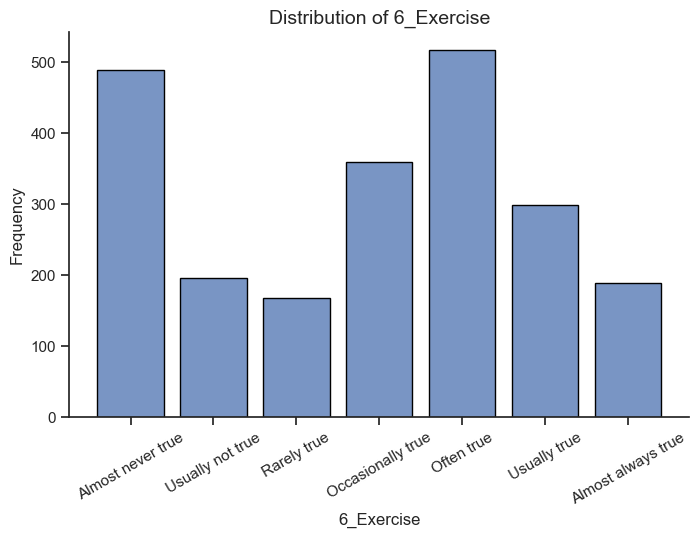

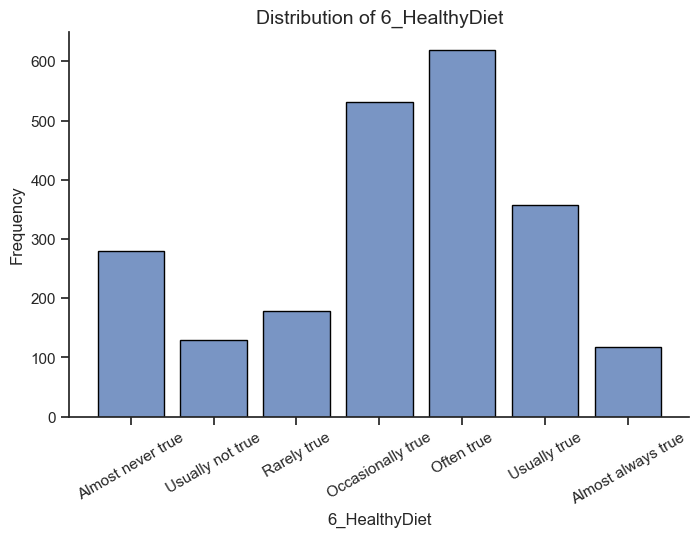

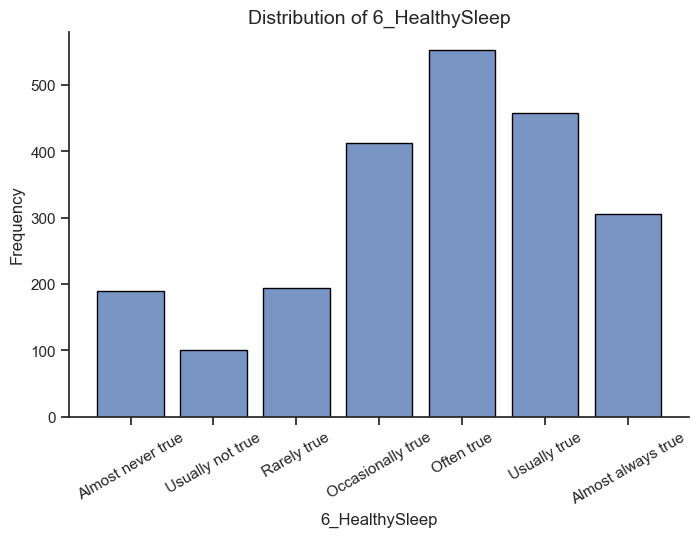

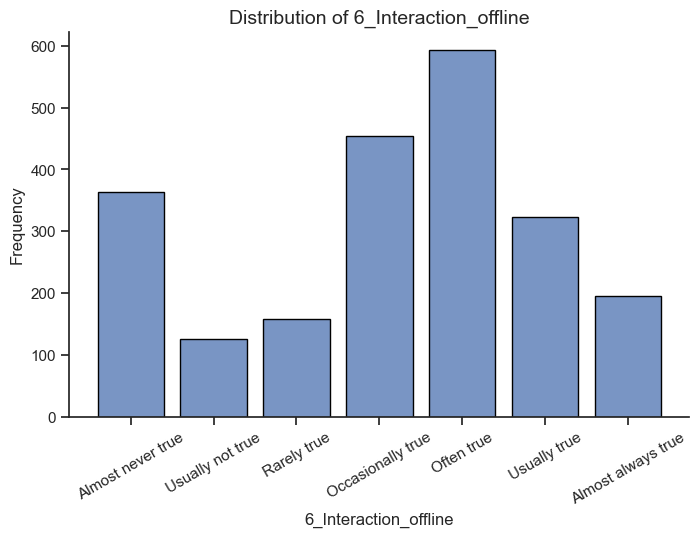

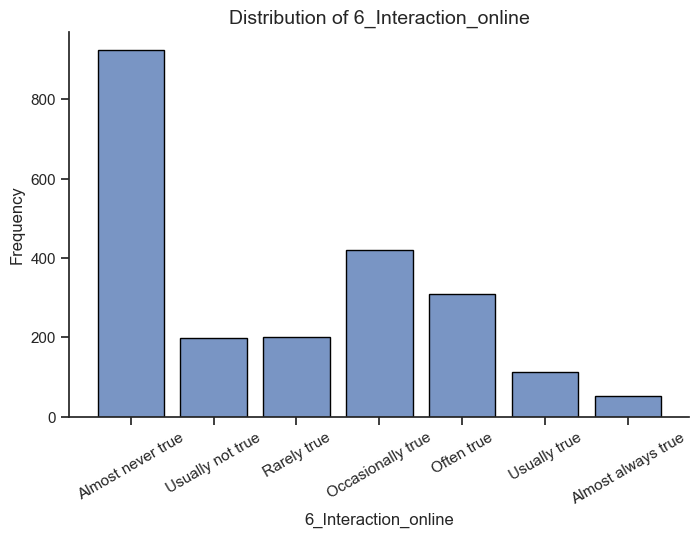

...

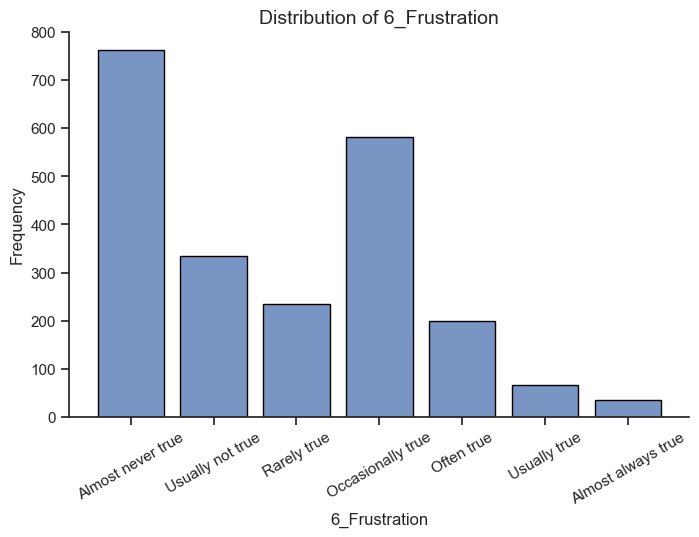

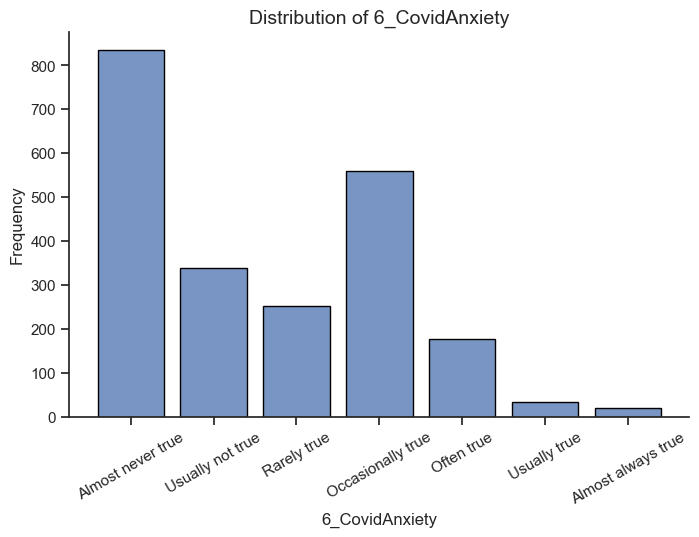

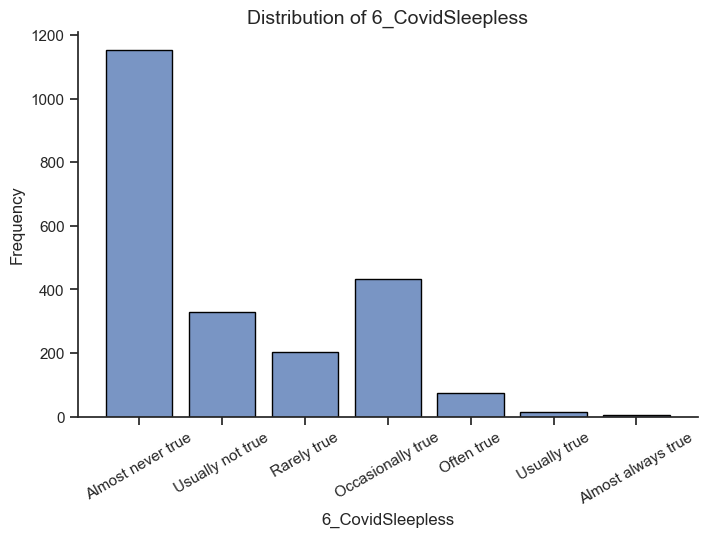

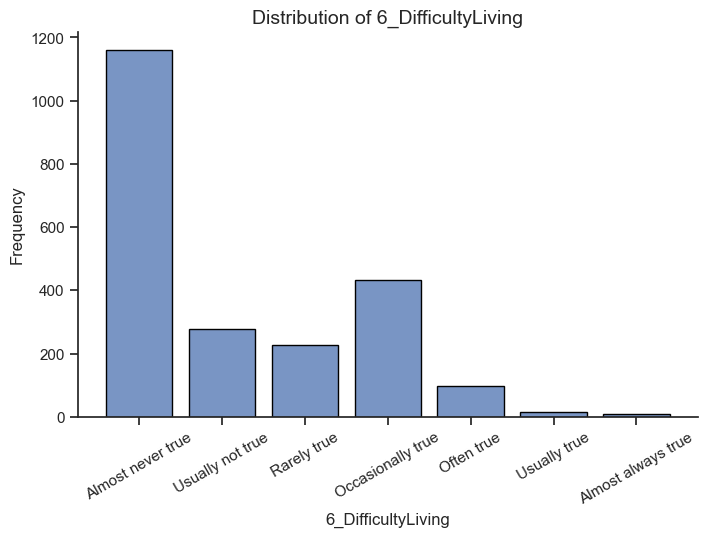

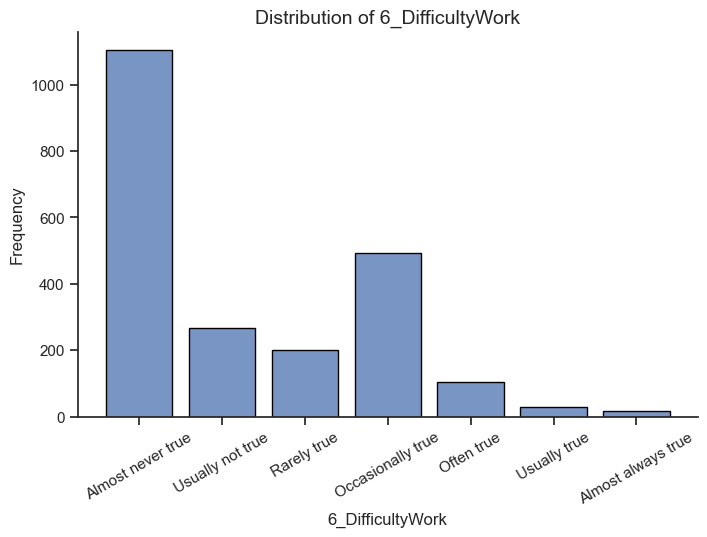

In [30]:
coping_strategies = [
 '6_Exercise', # i tried to exercise for my health (both indoors and outdoors) - 1 notapplicable - 7 very applicable
 '6_HealthyDiet', # i ate with a nutritional balance in mind - 1 not applicable - 7 very applicable
 '6_HealthySleep', #
 '6_Interaction_offline',
 '6_Interaction_online',
 '6_DeteriorationEconomy', # economic situation worsened
 '6_DeteriorationInteract', # interpersonal relationships with close people such as family and friends deteroirated
 '6_Frustration',
 '6_CovidAnxiety',
 '6_CovidSleepless',
 '6_DifficultyLiving',
 '6_DifficultyWork',
]

# https://www.extension.iastate.edu/documents/anr/likertscaleexamplesforsurveys.pdf
def likert_categories(x):
    if x == 1:
        return 'Almost never true'
    elif x == 2:
        return 'Usually not true'
    elif x == 3:
        return 'Rarely true'
    elif x == 4: 
        return 'Occasionally true'
    elif x == 5:
        return 'Often true'
    elif x == 6:
        return 'Usually true'
    else:
        return 'Almost always true'

category_order = [
    'Almost never true',
    'Usually not true',
    'Rarely true',
    'Occasionally true',
    'Often true',
    'Usually true',
    'Almost always true',
]

for i in coping_strategies:
    dataset_cleaned[i] = dataset_cleaned[i].apply(likert_categories)
    
    dataset_cleaned[i] = pd.Categorical(dataset_cleaned[i], categories=category_order)

    # Create histogram
    plt.figure(figsize=(8, 5))
    ax = sns.histplot(data=dataset_cleaned, 
                      x=i, 
                      discrete=True, 
                      shrink=0.8, 
                      palette=colors, 
                      edgecolor="black")
    
    # Show histogram
    plt.xlabel(i, fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.title("Distribution of " + i, fontsize=14)
    plt.xticks(rotation=30)
    sns.despine()
    plt.show()

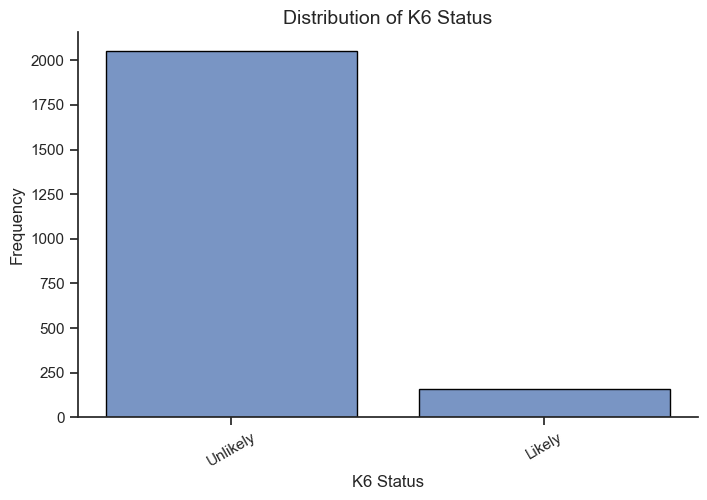

In [31]:
column = '6_K6_total'

def k6_categories(x):
    if 0 <= x <= 12:
        return 'Unlikely'
    elif 13 <= x <= 24:
        return 'Likely'
    
# Transform columns in categorical descriptions
dataset_cleaned[column] = dataset_cleaned[column].apply(k6_categories)

# Category order
category_order = [
'Unlikely',
'Likely'
]

dataset_cleaned[column] = pd.Categorical(dataset_cleaned[column], categories=category_order)

# Create histogram
plt.figure(figsize=(8, 5))
ax = sns.histplot(data=dataset_cleaned, 
                  x=column, 
                  discrete=True, 
                  shrink=0.8, 
                  palette=colors, 
                  edgecolor="black")

# Show histogram
plt.xlabel("K6 Status", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of K6 Status", fontsize=14)
plt.xticks(rotation=30)
sns.despine()
plt.show()

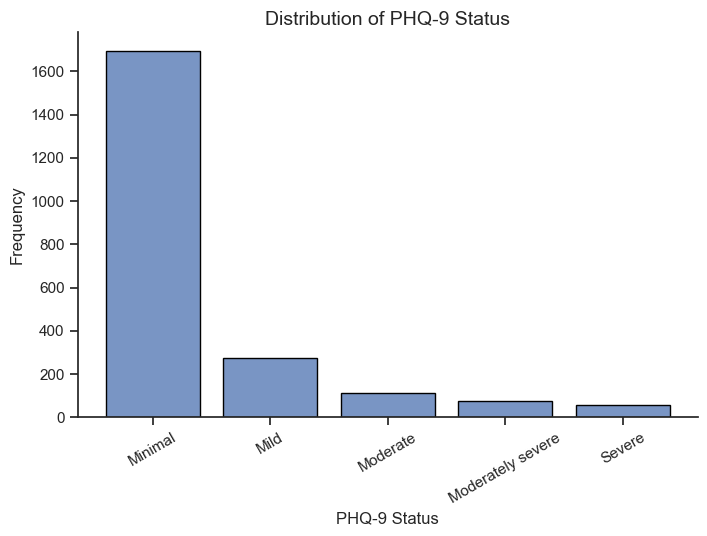

In [32]:
column = '6_PHQ9_total'

def phq9_categories(x):
    if 0 <= x <= 4:
        return 'Minimal'
    elif 5 <= x <= 9:
        return 'Mild'
    elif 10 <= x <= 14:
        return 'Moderate'
    elif 15 <= x <= 19:
        return 'Moderately severe'
    elif 20 <= x <= 27:
        return 'Severe'
    
# Transform columns in categorical descriptions
dataset_cleaned[column] = dataset_cleaned[column].apply(phq9_categories)

# Category order
category_order = [
'Minimal',
'Mild',
'Moderate',
'Moderately severe',
'Severe'
]

dataset_cleaned[column] = pd.Categorical(dataset_cleaned[column], categories=category_order)

# Create histogram
plt.figure(figsize=(8, 5))
ax = sns.histplot(data=dataset_cleaned, 
                  x=column, 
                  discrete=True, 
                  shrink=0.8, 
                  palette=colors, 
                  edgecolor="black")

# Show histogram
plt.xlabel("PHQ-9 Status", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of PHQ-9 Status", fontsize=14)
plt.xticks(rotation=30)
sns.despine()
plt.show()

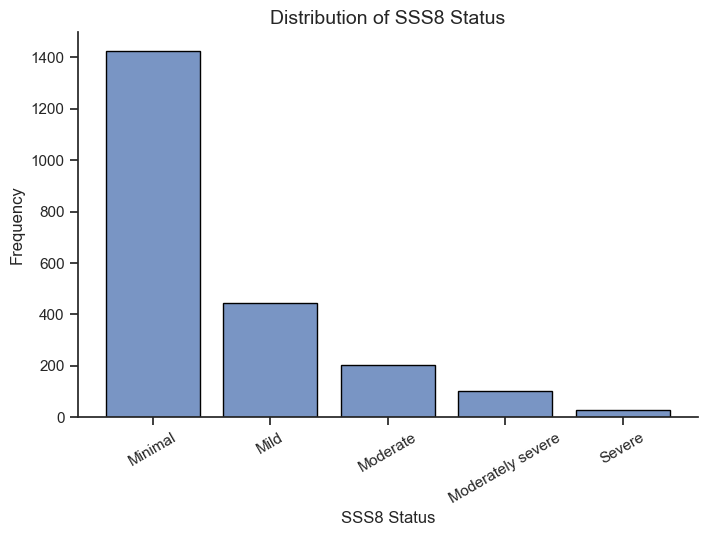

In [33]:
column = '6_SSS8_total'

def sss8_categories(x):
    if 0 <= x <= 4:
        return 'Minimal'
    elif 5 <= x <= 9:
        return 'Mild'
    elif 10 <= x <= 14:
        return 'Moderate'
    elif 15 <= x <= 19:
        return 'Moderately severe'
    elif 20 <= x <= 27:
        return 'Severe'
    
# Transform columns in categorical descriptions
dataset_cleaned[column] = dataset_cleaned[column].apply(sss8_categories)

# Category order
category_order = [
'Minimal',
'Mild',
'Moderate',
'Moderately severe',
'Severe'
]

dataset_cleaned[column] = pd.Categorical(dataset_cleaned[column], categories=category_order)

# Create histogram
plt.figure(figsize=(8, 5))
ax = sns.histplot(data=dataset_cleaned, 
                  x=column, 
                  discrete=True, 
                  shrink=0.8, 
                  palette=colors, 
                  edgecolor="black")

# Show histogram
plt.xlabel("SSS8 Status", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of SSS8 Status", fontsize=14)
plt.xticks(rotation=30)
sns.despine()
plt.show()

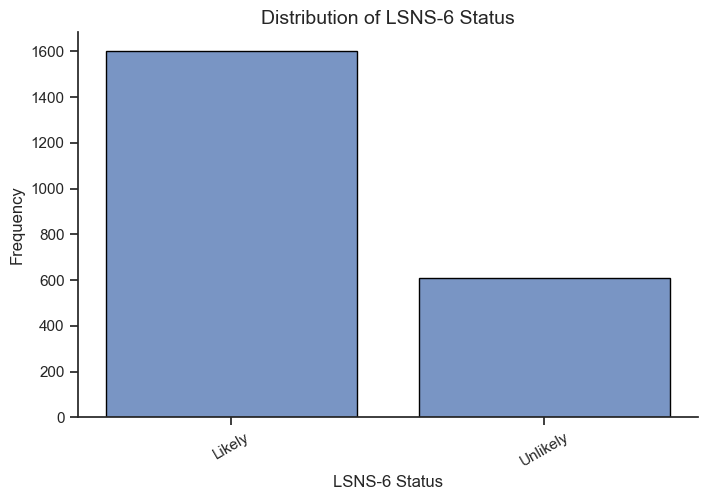

In [34]:
# cutoff of below 12
# https://pmc.ncbi.nlm.nih.gov/articles/PMC6660924/pdf/12905_2019_Article_792.pdf

column = '6_LSNS6_total'

def lsns6_categories(x):
    if x <= 12:
        return 'Likely'
    else:
        return 'Unlikely'
    
# Transform columns in categorical descriptions
dataset_cleaned[column] = dataset_cleaned[column].apply(lsns6_categories)

# Category order
category_order = [
'Likely',
'Unlikely'
]

dataset_cleaned[column] = pd.Categorical(dataset_cleaned[column], categories=category_order)

# Create histogram
plt.figure(figsize=(8, 5))
ax = sns.histplot(data=dataset_cleaned, 
                  x=column, 
                  discrete=True, 
                  shrink=0.8, 
                  palette=colors, 
                  edgecolor="black")

# Show histogram
plt.xlabel("LSNS-6 Status", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of LSNS-6 Status", fontsize=14)
plt.xticks(rotation=30)
sns.despine()
plt.show()

In [35]:
dataset_cleaned.head(10)

,6_SEX,6_AGE,6_MARRIED,6_JOB,6_HINCOME,6_Exercise,6_HealthyDiet,6_HealthySleep,6_Interaction_offline,6_Interaction_online,...,6_Frustration,6_CovidAnxiety,6_CovidSleepless,6_DifficultyLiving,6_DifficultyWork,6_K6_total,6_PHQ9_total,6_SSS8_total,6_UCLA_total,6_LSNS6_total
4,Male,57.0,Married,Company Employee (Technical),6-8 million yen,Often true,Occasionally true,Occasionally true,Occasionally true,Occasionally true,...,Rarely true,Often true,Often true,Often true,Often true,Unlikely,Moderately severe,Moderately severe,Moderate,Likely
8,Female,70.0,Married,Full-time Housewife/Househusband,12-15 million yen,Almost never true,Usually true,Almost always true,Occasionally true,Often true,...,Almost never true,Often true,Almost never true,Almost never true,Usually true,Unlikely,Minimal,Minimal,Minimal,Unlikely
11,Male,52.0,Unmarried,Company Employee (Clerical),4-6 million yen,Usually not true,Rarely true,Often true,Almost never true,Almost never true,...,Almost never true,Almost never true,Almost never true,Almost never true,Almost never true,Unlikely,Minimal,Minimal,Moderately high,Likely
15,Male,66.0,Married,Company Employee (Clerical),6-8 million yen,Usually true,Often true,Often true,Often true,Almost never true,...,Almost never true,Almost never true,Almost never true,Almost never true,Almost never true,Unlikely,Minimal,Minimal,Low,Unlikely
19,Male,63.0,Married,Management and Officers,12-15 million yen,Almost never true,Usually not true,Often true,Often true,Rarely true,...,Occasionally true,Occasionally true,Usually not true,Occasionally true,Occasionally true,Unlikely,Minimal,Minimal,Moderate,Unlikely
21,Male,62.0,Unmarried,Company Employee (Technical),4-6 million yen,Almost never true,Occasionally true,Usually true,Almost never true,Almost never true,...,Occasionally true,Occasionally true,Occasionally true,Occasionally true,Occasionally true,Unlikely,Minimal,Mild,Moderate,Likely
22,Male,69.0,Married,Part-time Worker,4-6 million yen,Almost always true,Usually true,Almost always true,Usually true,Almost never true,...,Usually not true,Usually not true,Usually not true,Usually not true,Usually not true,Unlikely,Minimal,Mild,Moderate,Likely
27,Male,46.0,Unmarried,Others,6-8 million yen,Usually not true,Occasionally true,Almost always true,Almost always true,Almost never true,...,Often true,Occasionally true,Occasionally true,Occasionally true,Occasionally true,Unlikely,Minimal,Moderate,Moderately high,Likely
31,Male,55.0,Unmarried,Company Employee (Clerical),6-8 million yen,Often true,Often true,Rarely true,Often true,Occasionally true,...,Occasionally true,Usually true,Usually not true,Occasionally true,Rarely true,Unlikely,Minimal,Moderate,Moderately high,Likely
32,Male,70.0,Married,Unemployed,4-6 million yen,Often true,Rarely true,Often true,Rarely true,Often true,...,Occasionally true,Rarely true,Almost never true,Usually not true,Almost never true,Unlikely,Minimal,Mild,Moderately high,Likely


In [36]:
len(dataset_cleaned)

2214

In [37]:
# Descriptive statistics
dataset_cleaned.describe()

,6_AGE
count,2214.000000
mean,56.699187
std,12.466198
min,23.000000
25%,48.000000
50%,57.000000
75%,65.000000
max,92.000000


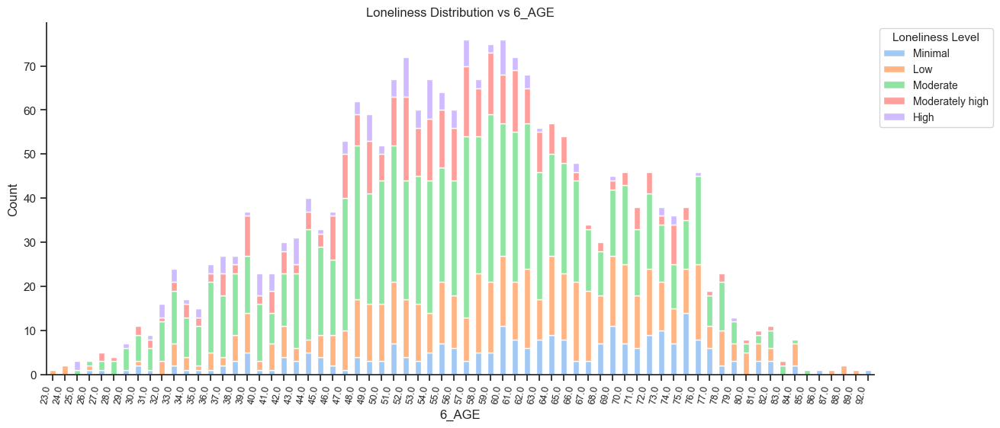

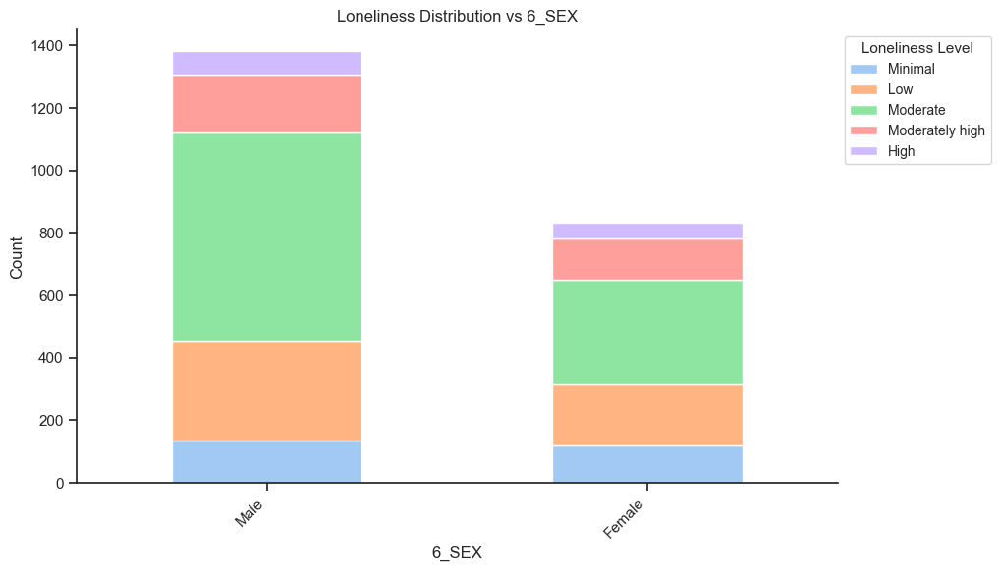

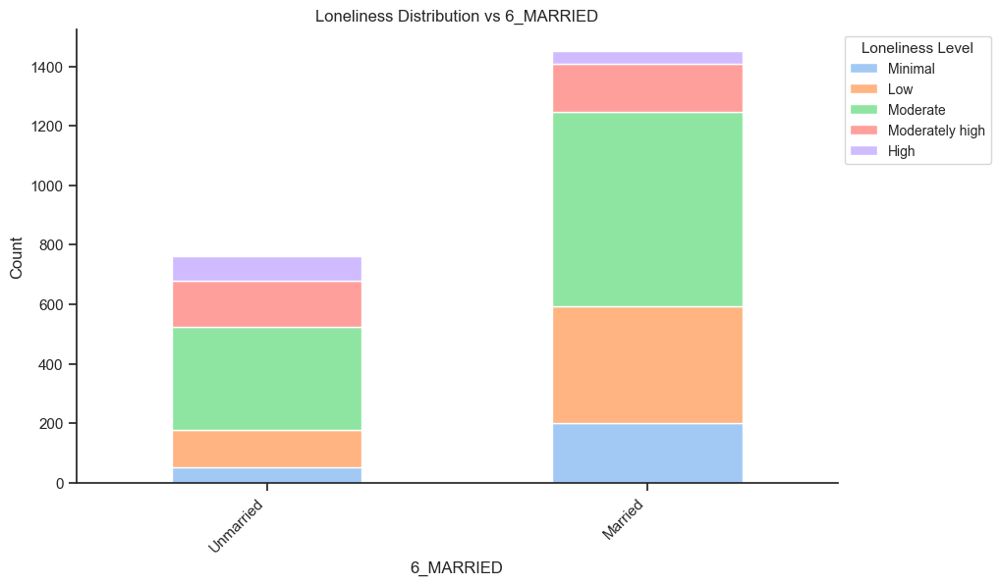

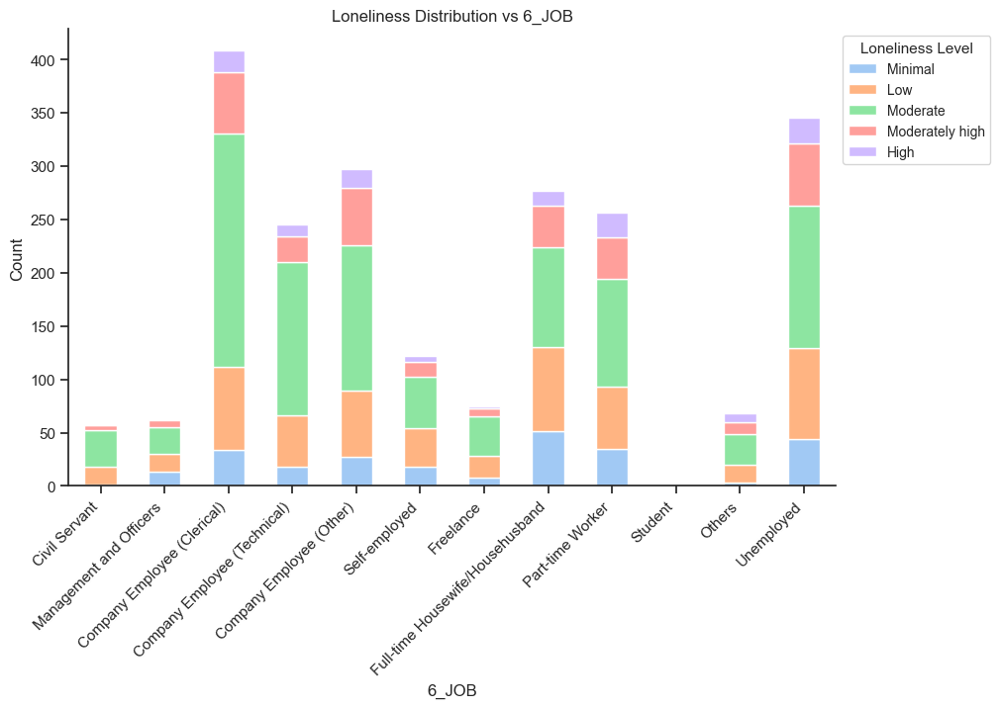

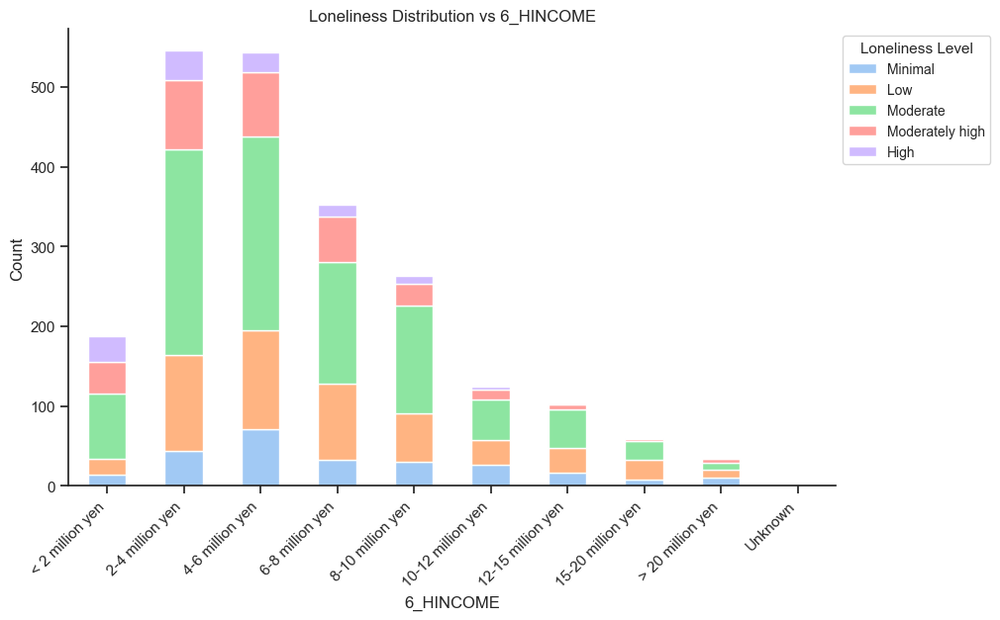

In [38]:
# https://www.geeksforgeeks.org/create-a-stacked-bar-plot-in-matplotlib/
demographic_vars = ['6_AGE', '6_SEX', '6_MARRIED', '6_JOB', '6_HINCOME']
loneliness_var = '6_UCLA_total'

for var in demographic_vars:
    stacked_data = dataset_cleaned.groupby([var, loneliness_var]).size().unstack(fill_value=0)
    
    num_categories = len(stacked_data.index)
    if num_categories > 12:
        rotation_angle = 80
        font_size = 9
        fig_width = 14
    else:
        rotation_angle = 45
        font_size = 11
        fig_width = 10

    stacked_data.plot(kind='bar', 
                      stacked=True, 
                      figsize=(fig_width, 6), 
                      color=colors,
                      title=f'Loneliness Distribution vs {var}')
    plt.xlabel(var)
    plt.ylabel('Count')
    plt.legend(title='Loneliness Level')
    plt.xticks(rotation=rotation_angle, ha='right', fontsize=font_size)
    sns.despine()
    
    # Move legend outside the plot
    # https://stackoverflow.com/questions/30490740/move-legend-outside-figure-in-seaborn-tsplot
    plt.legend(title='Loneliness Level', fontsize=10, title_fontsize=11, 
               loc='upper left', bbox_to_anchor=(1, 1)) 
    
    plt.show()

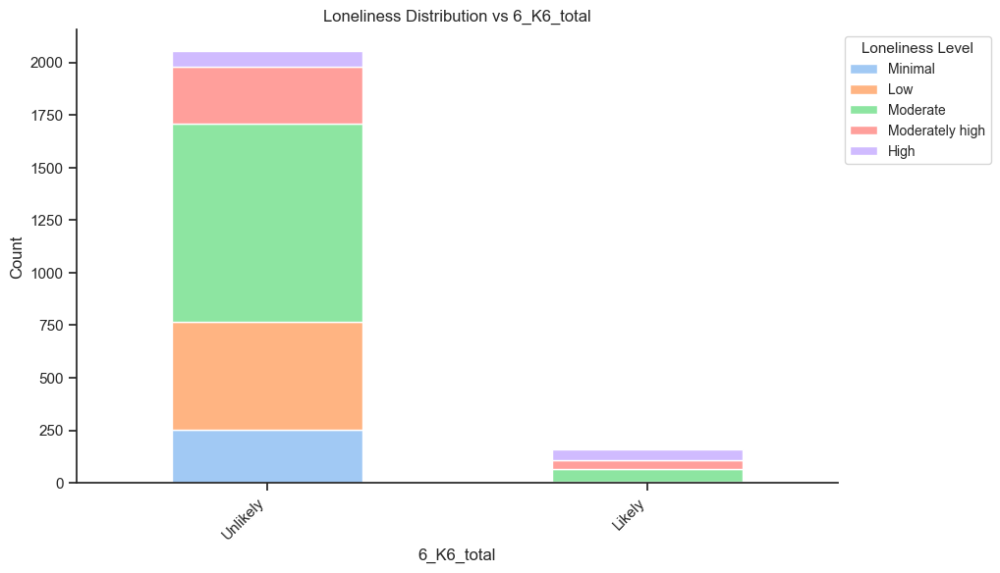

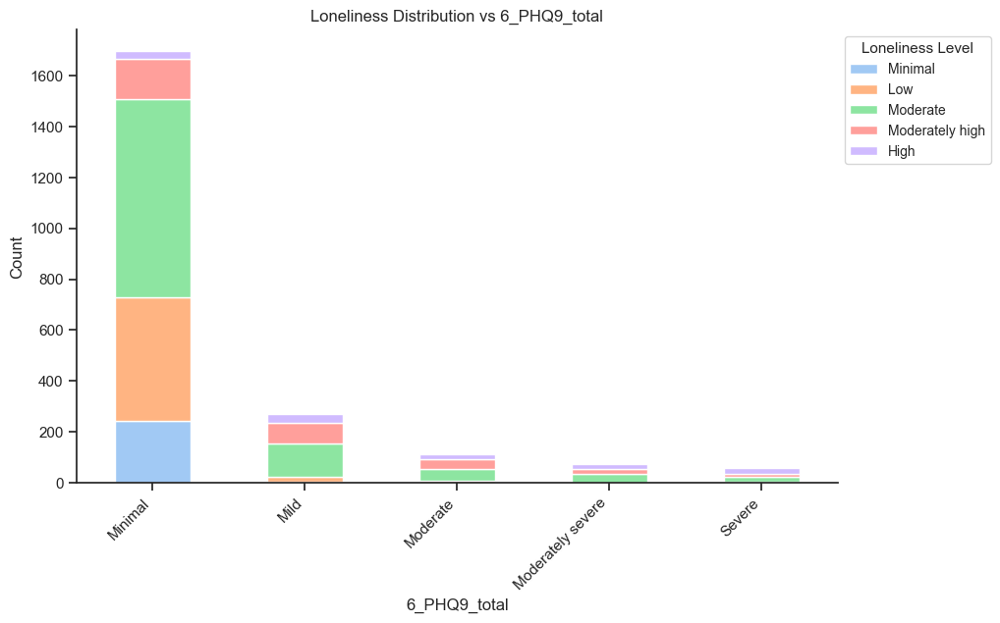

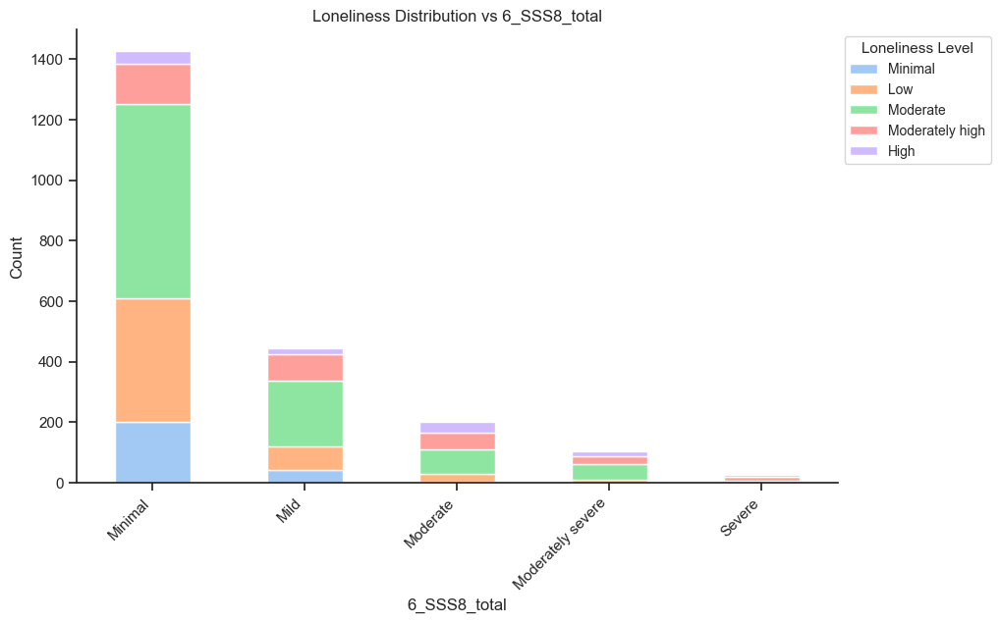

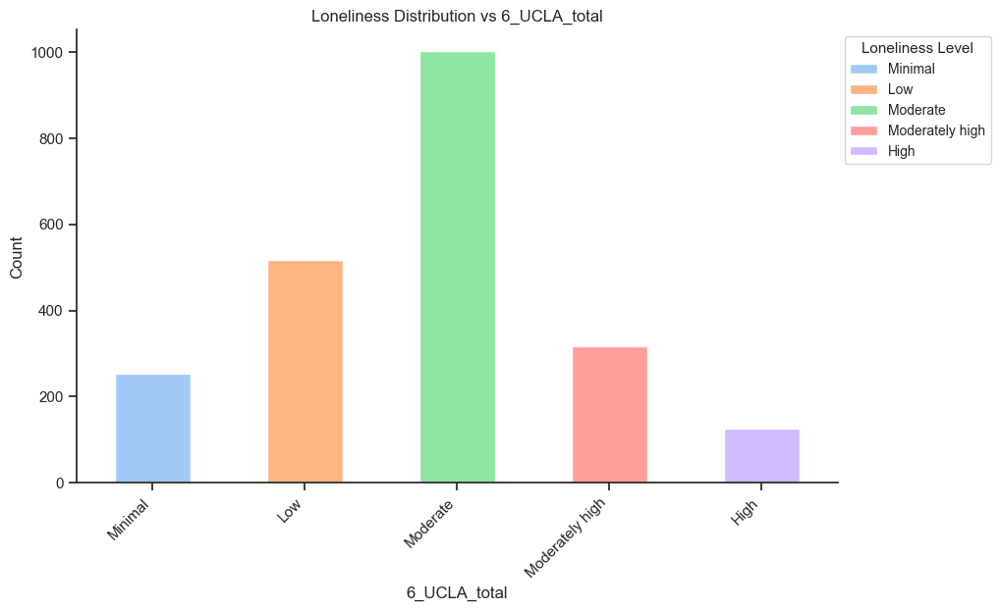

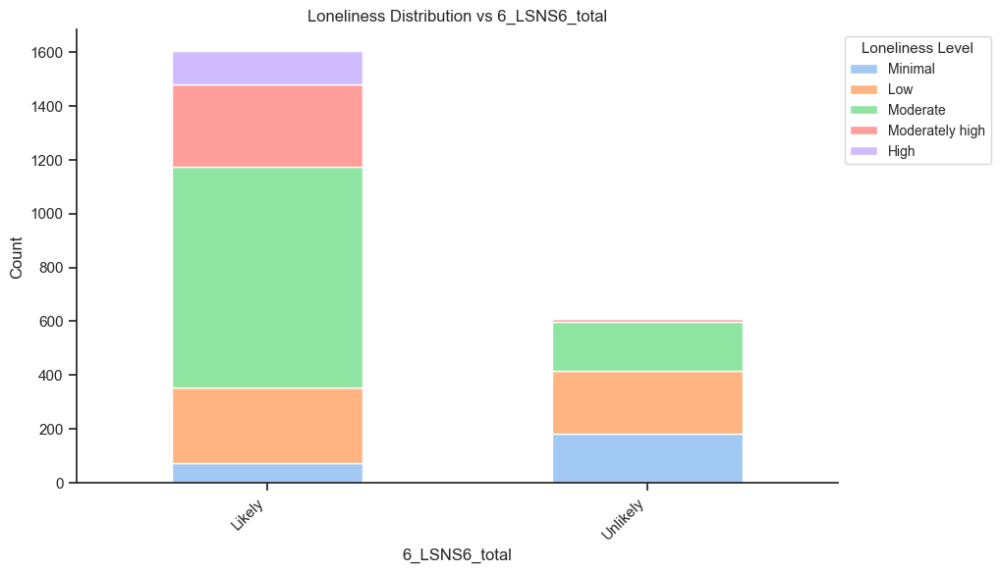

In [39]:
# https://www.geeksforgeeks.org/create-a-stacked-bar-plot-in-matplotlib/
psych_vars = ['6_K6_total', '6_PHQ9_total', '6_SSS8_total', '6_UCLA_total', '6_LSNS6_total']
loneliness_var = '6_UCLA_total'

for var in psych_vars:
    stacked_data = dataset_cleaned.groupby([var, loneliness_var]).size().unstack(fill_value=0)
    
    num_categories = len(stacked_data.index)
    if num_categories > 12:
        rotation_angle = 80
        font_size = 9
        fig_width = 14
    else:
        rotation_angle = 45
        font_size = 11
        fig_width = 10

    stacked_data.plot(kind='bar', 
                      stacked=True, 
                      figsize=(fig_width, 6), 
                      color=colors,
                      title=f'Loneliness Distribution vs {var}')
    plt.xlabel(var)
    plt.ylabel('Count')
    plt.legend(title='Loneliness Level')
    plt.xticks(rotation=rotation_angle, ha='right', fontsize=font_size)
    sns.despine()
    
    # Move legend outside the plot
    # https://stackoverflow.com/questions/30490740/move-legend-outside-figure-in-seaborn-tsplot
    plt.legend(title='Loneliness Level', fontsize=10, title_fontsize=11, 
               loc='upper left', bbox_to_anchor=(1, 1)) 
    
    plt.show()

In [40]:
# https://www.geeksforgeeks.org/ml-one-hot-encoding/

# Define continuous and categorical columns separately for clarity
noncategorical_columns = [
    '6_AGE', '6_HINCOME', '6_Exercise', '6_HealthyDiet', '6_HealthySleep', 
    '6_Interaction_offline', '6_Interaction_online', '6_DeteriorationEconomy', 
    '6_DeteriorationInteract', '6_Frustration', '6_CovidAnxiety', 
    '6_CovidSleepless', '6_DifficultyLiving', '6_DifficultyWork', 
    '6_K6_total', '6_PHQ9_total', '6_SSS8_total', '6_LSNS6_total'
]

categorical_columns = ['6_SEX', '6_MARRIED', '6_JOB']

target = ['6_UCLA_total']

# Merge necessary columns from both dataframes
df_model = pd.concat([
    df[noncategorical_columns], 
    dataset_cleaned[categorical_columns],
    dataset_cleaned[target]
], axis=1).copy()  # Use .copy() to avoid modifying original dataframe

# One-hot encoding for categorical variables
df_model = pd.get_dummies(df_model, columns=categorical_columns, drop_first=True, dtype=int)

# Display result
df_model.head()


,6_AGE,6_HINCOME,6_Exercise,6_HealthyDiet,6_HealthySleep,6_Interaction_offline,6_Interaction_online,6_DeteriorationEconomy,6_DeteriorationInteract,6_Frustration,...,6_JOB_Company Employee (Clerical),6_JOB_Company Employee (Technical),6_JOB_Company Employee (Other),6_JOB_Self-employed,6_JOB_Freelance,6_JOB_Full-time Housewife/Househusband,6_JOB_Part-time Worker,6_JOB_Student,6_JOB_Others,6_JOB_Unemployed
4,57.0,4.0,5.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,...,0,1,0,0,0,0,0,0,0,0
8,70.0,7.0,1.0,6.0,7.0,4.0,5.0,1.0,1.0,1.0,...,0,0,0,0,0,1,0,0,0,0
11,52.0,3.0,2.0,3.0,5.0,1.0,1.0,4.0,1.0,1.0,...,1,0,0,0,0,0,0,0,0,0
15,66.0,4.0,6.0,5.0,5.0,5.0,1.0,1.0,1.0,1.0,...,1,0,0,0,0,0,0,0,0,0
19,63.0,7.0,1.0,2.0,5.0,5.0,3.0,4.0,4.0,4.0,...,0,0,0,0,0,0,0,0,0,0


In [41]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [42]:
# Extract the target and features
y = df_model['6_UCLA_total']
X = df_model.drop(columns=['6_UCLA_total'])

# Encode the labels
encoder = LabelEncoder()
encoded_label = encoder.fit_transform(y)

# Reflect encoder changes in y
y_encoded = encoder.transform(y)

#Get the training and test set from the K6 dataset
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state= 30)

# Calculate the count of each unique label
unique_labels, label_counts = np.unique(y_test, return_counts=True)

In [43]:
labels = []

print("Test data distribution")
for label, count in zip(unique_labels, label_counts):
    label_name = encoder.inverse_transform([label])[0]
    labels.append(label_name)
    print(f"Label: {label_name}, Count: {count}")

Test data distribution
Label: High, Count: 39
Label: Low, Count: 151
Label: Minimal, Count: 76
Label: Moderate, Count: 298
Label: Moderately high, Count: 101


In [44]:
# -------------------------------------
# Library configuration
# -------------------------------------

from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, \
    f1_score

from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

In [45]:
# Define a function to train and predict using a given model
def train_and_predict(model, X_train, y_train, X_test):
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    return predictions

# Define a function to evaluate the model's predictions
def evaluate_model(y_test, predictions):
    accuracy = accuracy_score(y_test, predictions) * 100
    precision = precision_score(y_test, predictions, average='macro') * 100
    recall = recall_score(y_test, predictions, average='macro') * 100
    f1 = f1_score(y_test, predictions, average='macro') * 100
    return accuracy, precision, recall, f1


# Define a function to print evaluation metrics
def print_evaluation_metrics(accuracy, precision, recall, f1):
    print(f"Accuracy: {accuracy:.10f}")
    print(f"Precision: {precision:.10f}")
    print(f"Recall: {recall:.10f}")
    print(f"F1-score: {f1:.10f}")

# List of models to test
models = [
    ("Random Forest", RandomForestClassifier(random_state=random_state)),
    ("K-Nearest Neighbors", KNeighborsClassifier()),
    ("Decision Tree", DecisionTreeClassifier(random_state=random_state)),
    ("Gaussian Naive Bayes", GaussianNB()),
    ("Support Vector Machine", SVC(random_state=random_state)),
    ("MLP Classifier", MLPClassifier(random_state=random_state))
]

In [46]:
for model_name, model in models:
    print(f"\n  Model: {model_name}")
    predictions = train_and_predict(model, X_train, y_train, X_test)
    accuracy, precision, recall, f1 = evaluate_model(y_test, predictions)
    print_evaluation_metrics(accuracy, precision, recall, f1)


  Model: Random Forest
Accuracy: 55.6390977444
Precision: 55.1010781671
Recall: 40.5989806112
F1-score: 43.7685986957

  Model: K-Nearest Neighbors
Accuracy: 50.5263157895
Precision: 47.0373459309
Recall: 40.5569773400
F1-score: 42.0175592309

  Model: Decision Tree
Accuracy: 45.1127819549
Precision: 38.0339617727
Recall: 37.0799730731
F1-score: 37.3784614817

  Model: Gaussian Naive Bayes
Accuracy: 41.9548872180
Precision: 47.9351724929
Recall: 44.3230548685
F1-score: 33.8094462263

  Model: Support Vector Machine
Accuracy: 51.2781954887
Precision: 39.5673400673
Recall: 27.7628293451
F1-score: 23.9451577773

  Model: MLP Classifier
Accuracy: 54.4360902256
Precision: 50.2466035987
Recall: 45.5554326159
F1-score: 47.0653841615


In [47]:
best_model = RandomForestClassifier(random_state=random_state)
best_model.fit(X_train, y_train)

RandomForestClassifier(random_state=8)

In [48]:
predictions = best_model.predict(X_test)

[[ 10   0   0  17  12]
 [  0  63  15  69   4]
 [  0  37  20  18   1]
 [  2  27   3 252  14]
 [  2   6   0  68  25]]


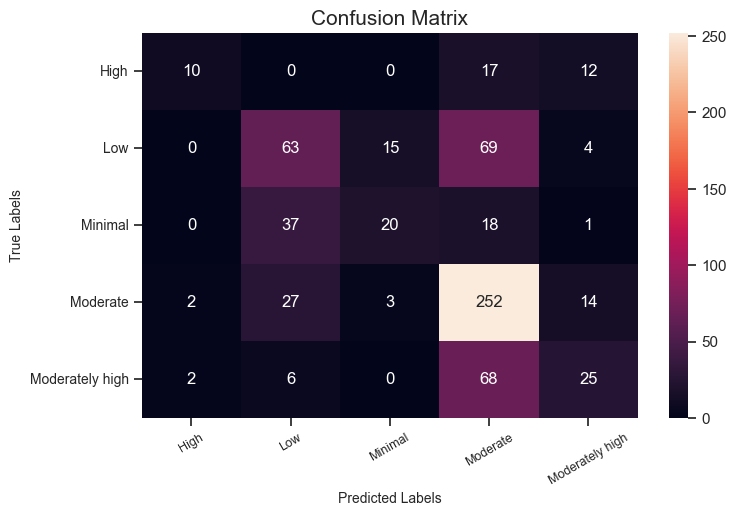

In [49]:
#Confusion matrix
cm = confusion_matrix(y_test, predictions)
print(cm)

#Plot the Confusion matrix graph
fig = plt.figure(figsize=(8, 5))
ax = plt.subplot()
sns.heatmap(cm, annot=True, ax=ax, fmt='g')
ax.set_xlabel('Predicted Labels', fontsize=10)
ax.xaxis.set_label_position('bottom')
plt.xticks(rotation=30)
ax.xaxis.set_ticklabels(labels, fontsize=9)
ax.xaxis.tick_bottom()

ax.set_ylabel('True Labels', fontsize=10)
ax.yaxis.set_ticklabels(labels, fontsize=10)
plt.yticks(rotation=0)

plt.title('Confusion Matrix', fontsize=15)

plt.show()

In [50]:
# Evaluate the model using accuracy, precision, recall, and F1-score
accuracy = accuracy_score(y_test, predictions)
precision = precision_score(y_test, predictions, average='macro')
recall = recall_score(y_test, predictions, average='macro')
f1 = f1_score(y_test, predictions, average='macro')


# Print the evaluation metrics
print("Accuracy: %.f" %(accuracy*100))
print("Precision: %.f" %(precision*100))
print("Recall: %.f" %(recall*100))
print("F1-score: %.f" %(f1*100))

Accuracy: 56
Precision: 55
Recall: 41
F1-score: 44


In [51]:
import pprint
import joblib as job
import time

from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
import sklearn.metrics as metrics

pp = pprint.PrettyPrinter(indent=1)

In [53]:
# Define hyperparameter space
n_estimators = [100, 250, 500, 1000]                       # Range of trees
max_features = ['sqrt', 'log2']                 # Feature selection
max_depth = [int(x) for x in np.linspace(10, 100, num=10)]
max_depth.append(None) # Depth
min_samples_split = [2, 5, 10, 15]                     # Control overfitting
min_samples_leaf = [1, 2, 4, 6]                       # Prevent overfitting
bootstrap = [True, False]                              # Sampling strategy
class_weight = ['balanced', None]               # Handling of imbalanced classes
cv = 10                                         # Cross-validation folds

# Create the random grid
random_grid = {
    'n_estimators': n_estimators,
    'max_features': max_features,
    'max_depth': max_depth,
    'min_samples_split': min_samples_split,
    'min_samples_leaf': min_samples_leaf,
    'bootstrap': bootstrap,
    'class_weight': class_weight
}

print('Hyperparameter search space:')
pp.pprint(random_grid)

# Set the hyperparameter tuner
start_time = time.time()
model = RandomForestClassifier(random_state=random_state, verbose=0)

# Randomized Search CV
print("\nStarting Randomized Search CV...")
tuner = RandomizedSearchCV(estimator=model, 
                           param_distributions=random_grid, 
                           n_iter=200, 
                           cv=10, 
                           scoring='r2', 
                           random_state=random_state, 
                           verbose=1, 
                           return_train_score=True, 
                           n_jobs=10)

# Fit the random search model
print("Fitting the Randomized Search model...")
tuner.fit(X_train, y_train)
print("Randomized Search CV completed.")

# Time taken for Randomized Search
end_time = time.time()
running_time = end_time - start_time
print('\nRandom Forest training time:', running_time, 's')

Hyperparameter search space:
{'bootstrap': [True, False],
 'class_weight': ['balanced', None],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'max_features': ['sqrt', 'log2'],
 'min_samples_leaf': [1, 2, 4, 6],
 'min_samples_split': [2, 5, 10, 15],
 'n_estimators': [100, 250, 500, 1000]}

Starting Randomized Search CV...
Fitting the Randomized Search model...
Fitting 10 folds for each of 200 candidates, totalling 2000 fits
Randomized Search CV completed.

Random Forest training time: 246.78253483772278 s


In [54]:
# Save the model
model_name = type(tuner).__name__
file_name = model_name + '_' + time.strftime("%Y%m%d-%H%M%S") + '.mod'
file_save = file_name

print('Saving', model_name, 'model as', file_name, '...')
job.dump(tuner, file_save) 

Saving RandomizedSearchCV model as RandomizedSearchCV_20250225-223744.mod ...


['RandomizedSearchCV_20250225-223744.mod']

In [52]:
# Load the model
file_model = 'RandomizedSearchCV_20250225-223744.mod'
file_load = file_model

saved_model = job.load(file_load) 
tuner = saved_model

print('Best hyperparameters:')
pp.pprint(tuner.best_estimator_.get_params())

Best hyperparameters:
{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 70,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 6,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 8,
 'verbose': 0,
 'warm_start': False}


{'n_estimators': [100, 250, 500, 1000], 'max_features': ['sqrt', 'log2'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None], 'min_samples_split': [2, 5, 10, 15], 'min_samples_leaf': [1, 2, 4, 6], 'bootstrap': [True, False], 'class_weight': ['balanced', None]}
n_estimators = 100 : -0.3576022755839897
n_estimators = 250 : -0.2936063879921204
n_estimators = 500 : -0.3447385004001174
n_estimators = 1000 : -0.3320224389158885
max_features = sqrt : -0.3067572833912081
max_features = log2 : -0.36265115625197236
max_depth = 10 : -0.32193953671657755
max_depth = 20 : -0.3174023317891337
max_depth = 30 : -0.3689842150401724
max_depth = 40 : -0.34651750343400967
max_depth = 50 : -0.3438678300289743
max_depth = 60 : -0.4124635893801998
max_depth = 70 : -0.33818990120236886
max_depth = 80 : -0.33625630836381015
max_depth = 90 : -0.2988957306724234
max_depth = 100 : -0.34299891907537916
max_depth = None : -0.29751384470497466
min_samples_split = 2 : -0.29415252771638906
min_samples_split 

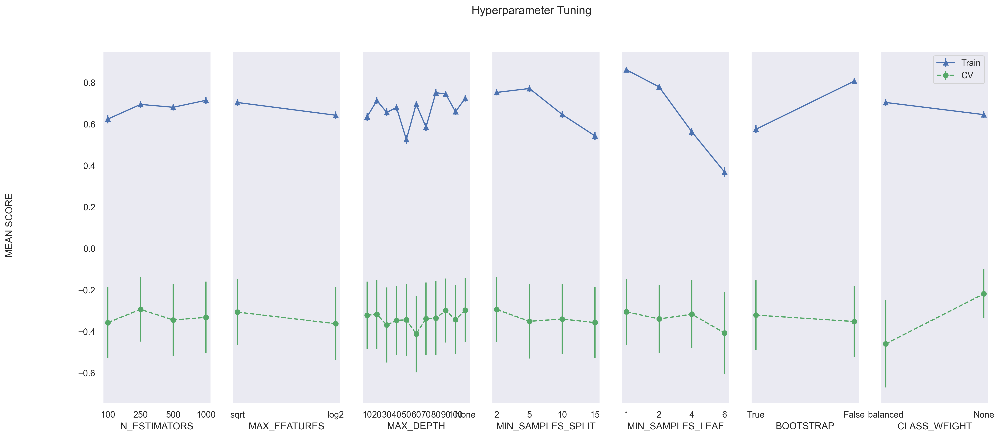

{'mean_fit_time': array([0.81952534, 0.39002595, 2.01584332, 0.51696694, 0.36524625,
       0.63531199, 0.47414937, 0.3763639 , 1.20630355, 0.51251211,
       0.40031202, 0.58047431, 0.19980497, 0.30105457, 1.68025796,
       0.55099707, 0.3542526 , 1.13941579, 2.13268201, 1.10833023,
       0.22142522, 2.39603953, 2.1990756 , 1.06268458, 0.50715585,
       0.67539613, 0.61126444, 3.11410091, 1.02951324, 1.08360579,
       0.22962191, 2.80593596, 1.29058104, 0.23469005, 0.62778862,
       0.95567293, 0.24850314, 0.24128554, 0.50315597, 2.83815594,
       0.23441133, 1.10200136, 0.20514362, 2.70642128, 0.23648963,
       0.27479942, 0.29130793, 0.62495179, 0.23438637, 1.11528442,
       2.15383532, 1.27338777, 0.22287147, 1.13489528, 2.13494744,
       1.69662802, 3.56991713, 0.25991976, 2.70634391, 2.34752274,
       2.46090348, 0.23991542, 0.27329731, 1.17181284, 0.65284202,
       2.16105821, 1.08601799, 1.30364082, 0.20411487, 2.01879263,
       0.25014951, 2.74554052, 0.22973108, 0

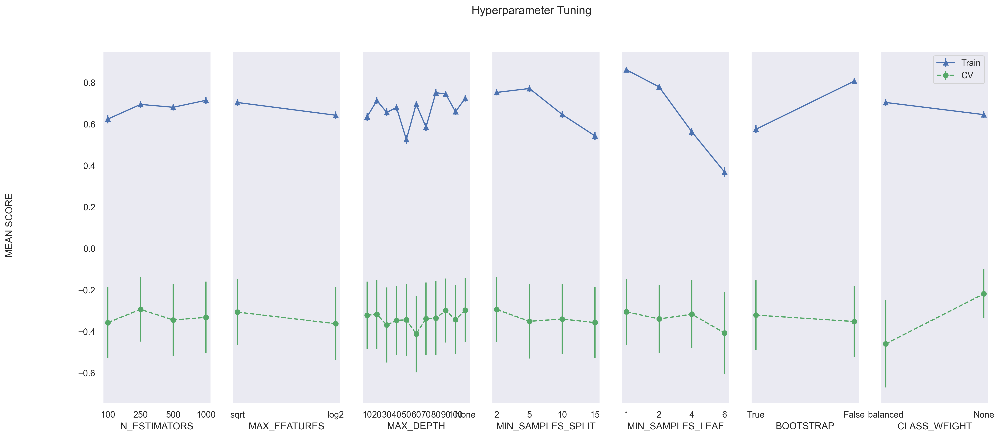

In [53]:
## Plot CV results
def plot_cv(tuner):
    results = tuner.cv_results_
    cv_params = tuner.param_distributions
    means_test = results['mean_test_score']
    stds_test = results['std_test_score']
    means_train = results['mean_train_score']
    stds_train = results['std_train_score']

    print(cv_params)
    fig, ax = plt.subplots(1, len(cv_params), sharex='none', sharey='all', figsize=(20,8), dpi=300)
    fig.suptitle('Hyperparameter Tuning')
    fig.text(0.04, 0.5, 'MEAN SCORE', va='center', rotation='vertical')

    scores = {}
    for i, (param, param_val) in enumerate(cv_params.items()):
        x, y1, e1, y2, e2 = [], [], [], [], []

        for v in param_val:
            mask_idx = results['param_'+param]==v
            v = str(v)

            m_train = np.mean(means_train[mask_idx])
            s_train = np.sqrt(np.mean(stds_train[mask_idx]**2))
            m_test = np.mean(means_test[mask_idx])    
            s_test = np.sqrt(np.mean(stds_test[mask_idx]**2))

            scores[param+'='+v+'_means_train'] = m_train
            scores[param+'='+v+'_stds_train'] = s_train    
            scores[param+'='+v+'_means_test'] = m_test
            scores[param+'='+v+'_stds_test'] = s_test
            print(param, "=", v, ":", m_test)

            x.append(v)
            y1.append(m_train)
            e1.append(s_train) 
            y2.append(m_test) 
            e2.append(s_test)

        ax[i].errorbar(x, y1, e1, linestyle='-', marker='^', label='Train')
        ax[i].errorbar(x, y2, e2, linestyle='--', marker='o', color='g', label='CV')
        ax[i].set_xlabel(param.upper())

    # pp.pprint(scores)

    plt.legend()
    plt.show()

sns.set_style('dark')
plot_cv(tuner)
print(tuner.cv_results_)
plot_cv(saved_model)

In [54]:
## Evaluate model
def evaluate(model, X, y_actual):
    y_predicted = model.predict(X)
    mae = metrics.mean_absolute_error(y_actual, y_predicted)
    mse = metrics.mean_squared_error(y_actual, y_predicted)
    rmse = np.sqrt(mse)
    re = np.divide(np.abs(y_actual - y_predicted), y_actual) * 100
    mre = np.mean(re)
    r2 = model.score(X, y_actual)

    print('Model Performance')
    print('MAE: {:0.4f}'.format(mae))
    print('MSE: {:0.4f}'.format(mse))
    print('RMSE: {:0.4f}'.format(rmse))
    print('MRE: {:0.4f}%'.format(mre))
    print('R2: {:0.4f}'.format(r2))
    
    return r2

print('Base model')
base_model = RandomForestClassifier(random_state=random_state)
base_model.fit(X_train, y_train)
base_accuracy = evaluate(base_model, X_test, y_test)

print('\nTuned model')
tuned_model = tuner.best_estimator_
tuned_accuracy = evaluate(tuned_model, X_test, y_test)

print('\nSaved model')
saved_accuracy = evaluate(saved_model.best_estimator_, X_test, y_test)

print('\nImprovement: {:0.2f}'.format(tuned_accuracy - base_accuracy))

Base model
Model Performance
MAE: 0.7398
MSE: 1.5459
RMSE: 1.2433
MRE: nan%
R2: 0.5564

Tuned model
Model Performance
MAE: 0.7368
MSE: 1.5519
RMSE: 1.2457
MRE: nan%
R2: 0.5609

Saved model
Model Performance
MAE: 0.7368
MSE: 1.5519
RMSE: 1.2457
MRE: nan%
R2: 0.5609

Improvement: 0.00


In [55]:
predictions = tuned_model.predict(X_test)

[[  7   0   0  18  14]
 [  0  70  10  67   4]
 [  0  36  21  18   1]
 [  2  29   3 252  12]
 [  1   4   0  73  23]]


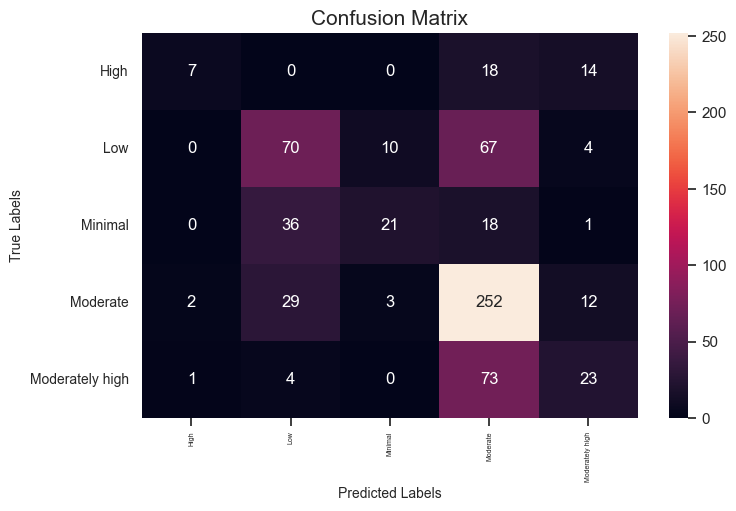

In [56]:
#Confusion matrix
cm = confusion_matrix(y_test, predictions)
print(cm)

#Plot the Confusion matrix graph
fig = plt.figure(figsize=(8, 5))
ax = plt.subplot()
sns.heatmap(cm, annot=True, ax=ax, fmt='g')
ax.set_xlabel('Predicted Labels', fontsize=10)
ax.xaxis.set_label_position('bottom')
plt.xticks(rotation=90)
ax.xaxis.set_ticklabels(labels, fontsize=5)
ax.xaxis.tick_bottom()

ax.set_ylabel('True Labels', fontsize=10)
ax.yaxis.set_ticklabels(labels, fontsize=10)
plt.yticks(rotation=0)

plt.title('Confusion Matrix', fontsize=15)

plt.show()

In [57]:
# Evaluate the model using accuracy, precision, recall, and F1-score
accuracy = accuracy_score(y_test, predictions)
precision = precision_score(y_test, predictions, average='macro')
recall = recall_score(y_test, predictions, average='macro')
f1 = f1_score(y_test, predictions, average='macro')


# Print the evaluation metrics
print("Accuracy: %.f" %(accuracy*100))
print("Precision: %.f" %(precision*100))
print("Recall: %.f" %(recall*100))
print("F1-score: %.f" %(f1*100))

Accuracy: 56
Precision: 57
Recall: 40
F1-score: 43


In [58]:
import shap
import pickle

In [63]:
# Calculate SHAP
explainer = shap.TreeExplainer(tuned_model)

In [64]:
shap_values = explainer.shap_values(X_train)
shap_test_values = explainer.shap_values(X_test)

In [65]:
# Define paths for saving
explainer_path = "explainer.pkl"
shap_values_train_path = "shap_values_train.pkl"
shap_values_test_path = "shap_values_test.pkl"

In [66]:
# Save the explainer
with open(explainer_path, "wb") as f:
    pickle.dump(explainer, f)

# Save the SHAP values for training and test data
with open(shap_values_train_path, "wb") as f:
    pickle.dump(shap_values, f)

with open(shap_values_test_path, "wb") as f:
    pickle.dump(shap_test_values, f)

In [67]:
# Load the explainer
with open(explainer_path, "rb") as f:
    explainer = pickle.load(f)

# Load the SHAP values for training and test data
with open(shap_values_train_path, "rb") as f:
    shap_values = pickle.load(f)

with open(shap_values_test_path, "rb") as f:
    shap_test_values = pickle.load(f)


In [68]:
# Creating features list
features_list = df_model.drop(columns=['6_UCLA_total']).columns.tolist()
features_list

['6_AGE',
 '6_HINCOME',
 '6_Exercise',
 '6_HealthyDiet',
 '6_HealthySleep',
 '6_Interaction_offline',
 '6_Interaction_online',
 '6_DeteriorationEconomy',
 '6_DeteriorationInteract',
 '6_Frustration',
 '6_CovidAnxiety',
 '6_CovidSleepless',
 '6_DifficultyLiving',
 '6_DifficultyWork',
 '6_K6_total',
 '6_PHQ9_total',
 '6_SSS8_total',
 '6_LSNS6_total',
 '6_SEX_Female',
 '6_MARRIED_Married',
 '6_JOB_Management and Officers',
 '6_JOB_Company Employee (Clerical)',
 '6_JOB_Company Employee (Technical)',
 '6_JOB_Company Employee (Other)',
 '6_JOB_Self-employed',
 '6_JOB_Freelance',
 '6_JOB_Full-time Housewife/Househusband',
 '6_JOB_Part-time Worker',
 '6_JOB_Student',
 '6_JOB_Others',
 '6_JOB_Unemployed']

In [69]:
df_model

,6_AGE,6_HINCOME,6_Exercise,6_HealthyDiet,6_HealthySleep,6_Interaction_offline,6_Interaction_online,6_DeteriorationEconomy,6_DeteriorationInteract,6_Frustration,...,6_JOB_Company Employee (Clerical),6_JOB_Company Employee (Technical),6_JOB_Company Employee (Other),6_JOB_Self-employed,6_JOB_Freelance,6_JOB_Full-time Housewife/Househusband,6_JOB_Part-time Worker,6_JOB_Student,6_JOB_Others,6_JOB_Unemployed
4,57.0,4.0,5.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,...,0,1,0,0,0,0,0,0,0,0
8,70.0,7.0,1.0,6.0,7.0,4.0,5.0,1.0,1.0,1.0,...,0,0,0,0,0,1,0,0,0,0
11,52.0,3.0,2.0,3.0,5.0,1.0,1.0,4.0,1.0,1.0,...,1,0,0,0,0,0,0,0,0,0
15,66.0,4.0,6.0,5.0,5.0,5.0,1.0,1.0,1.0,1.0,...,1,0,0,0,0,0,0,0,0,0
19,63.0,7.0,1.0,2.0,5.0,5.0,3.0,4.0,4.0,4.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11204,57.0,2.0,5.0,5.0,4.0,4.0,5.0,5.0,4.0,4.0,...,1,0,0,0,0,0,0,0,0,0
11208,55.0,7.0,2.0,7.0,7.0,2.0,2.0,1.0,1.0,1.0,...,1,0,0,0,0,0,0,0,0,0
11209,50.0,5.0,3.0,4.0,3.0,3.0,3.0,3.0,4.0,3.0,...,0,0,0,0,0,1,0,0,0,0
11288,33.0,4.0,5.0,4.0,5.0,5.0,4.0,2.0,2.0,2.0,...,1,0,0,0,0,0,0,0,0,0


In [70]:
class_names = ['Minimal', 'Low', 'Moderate', 'Moderately high', 'High']

SHAP summary plot for class: Minimal


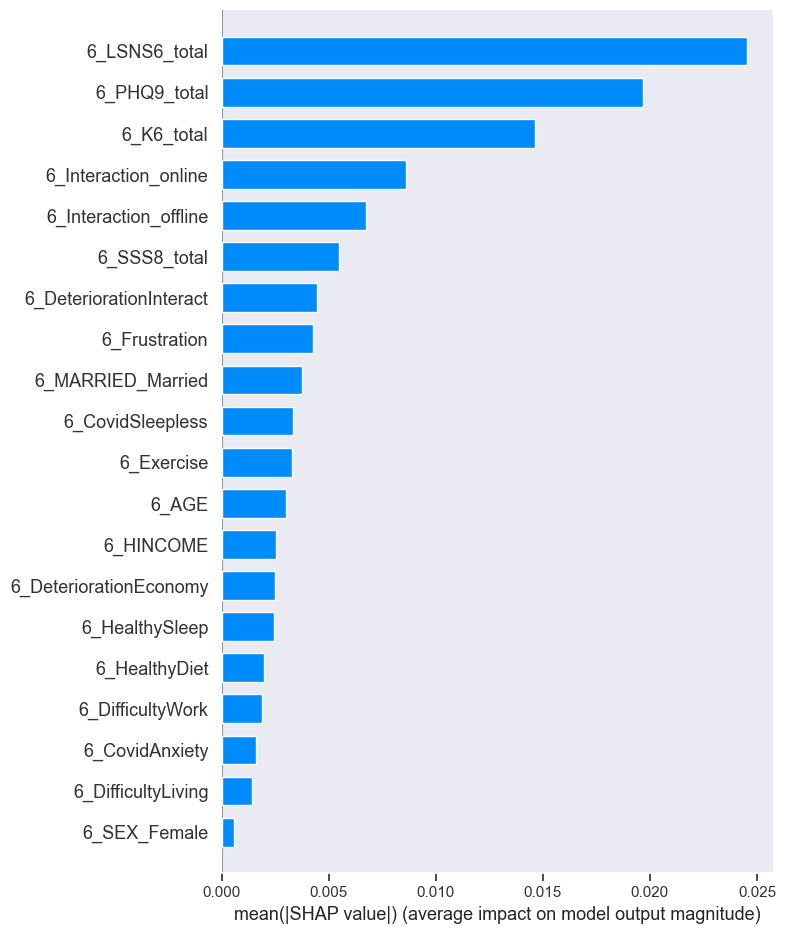

SHAP summary plot for class: Low


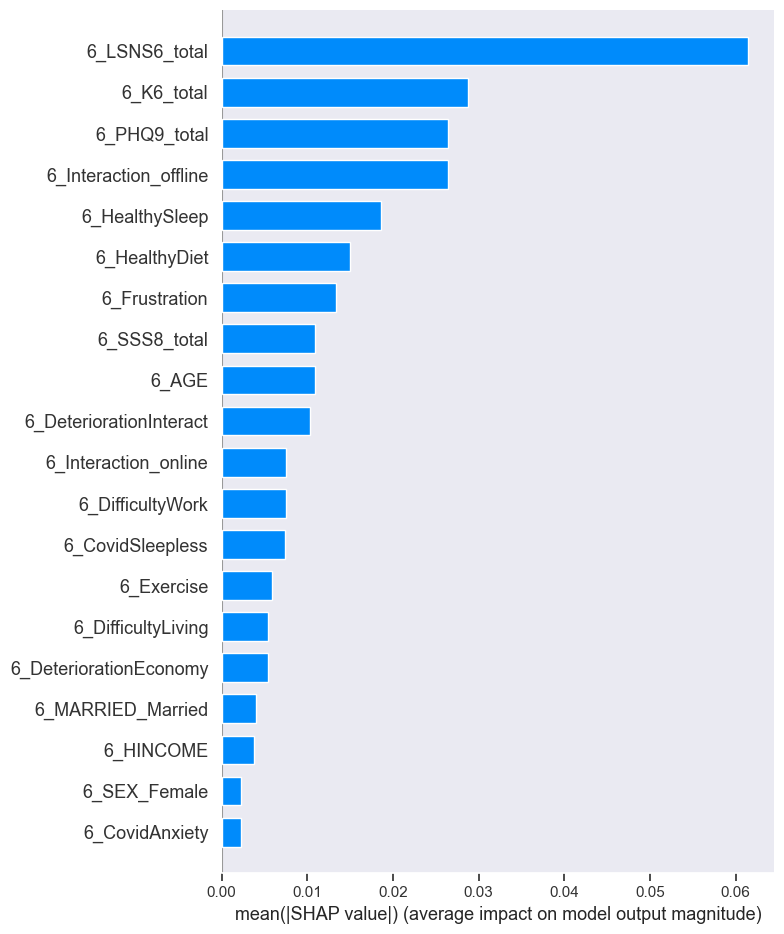

SHAP summary plot for class: Moderate


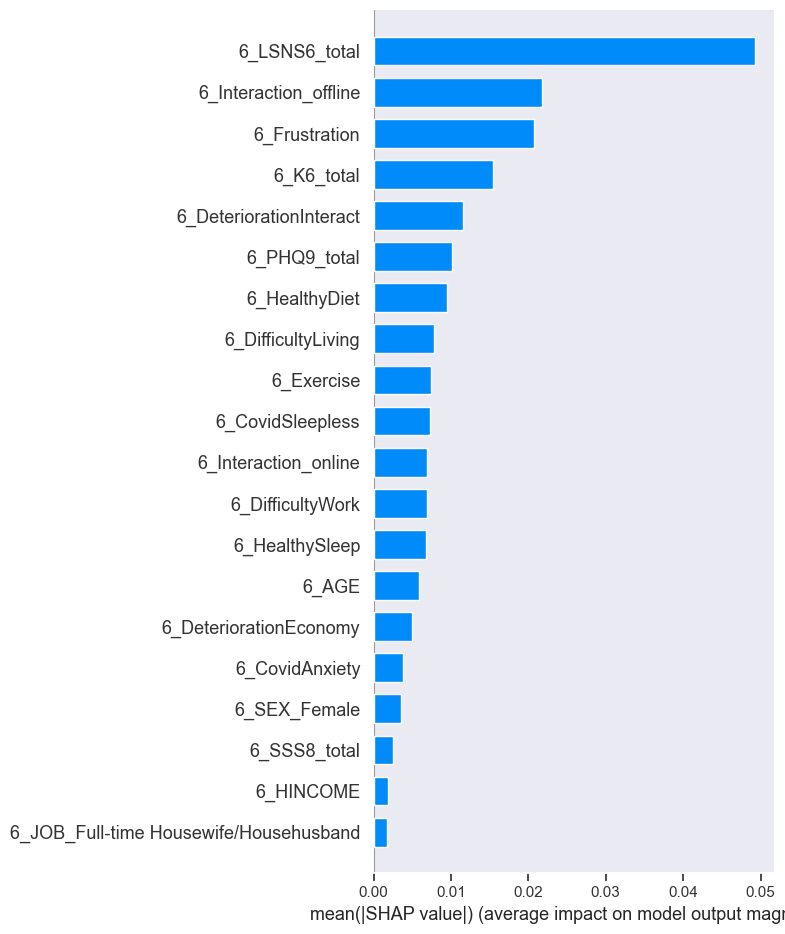

SHAP summary plot for class: Moderately high


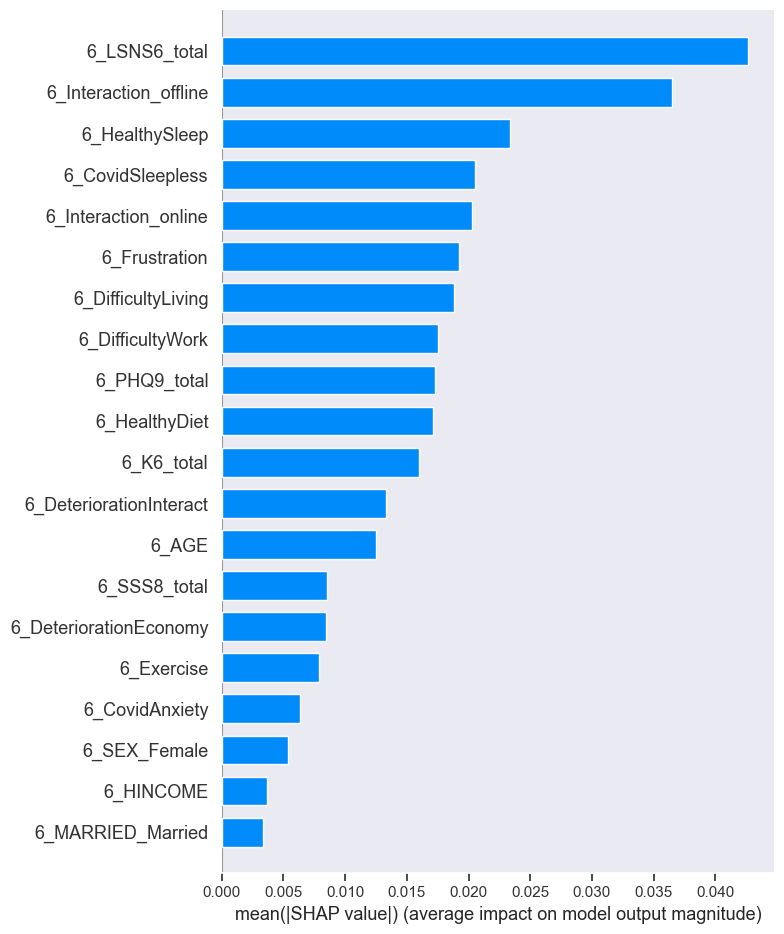

SHAP summary plot for class: High


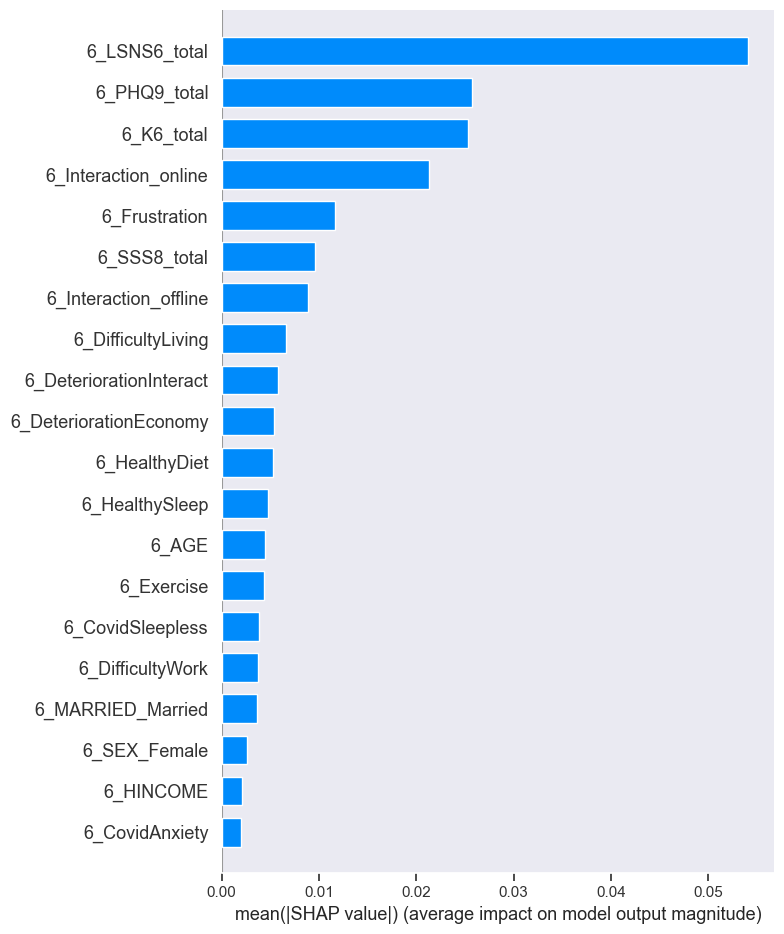

In [71]:
# Plot SHAP values for each class without manually specifying `n`
for i, class_name in enumerate(class_names):
    print(f"SHAP summary plot for class: {class_name}")
    shap.summary_plot(shap_values[:, :, i], X_train, feature_names=features_list, plot_type="bar")

SHAP summary plot for class: Minimal


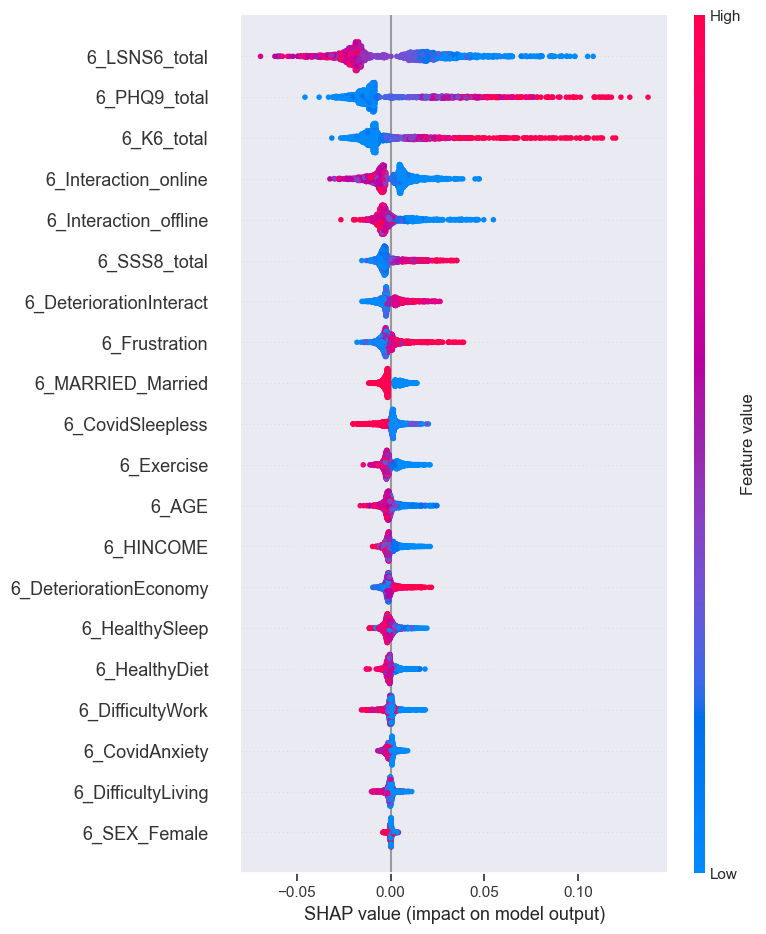

SHAP summary plot for class: Low


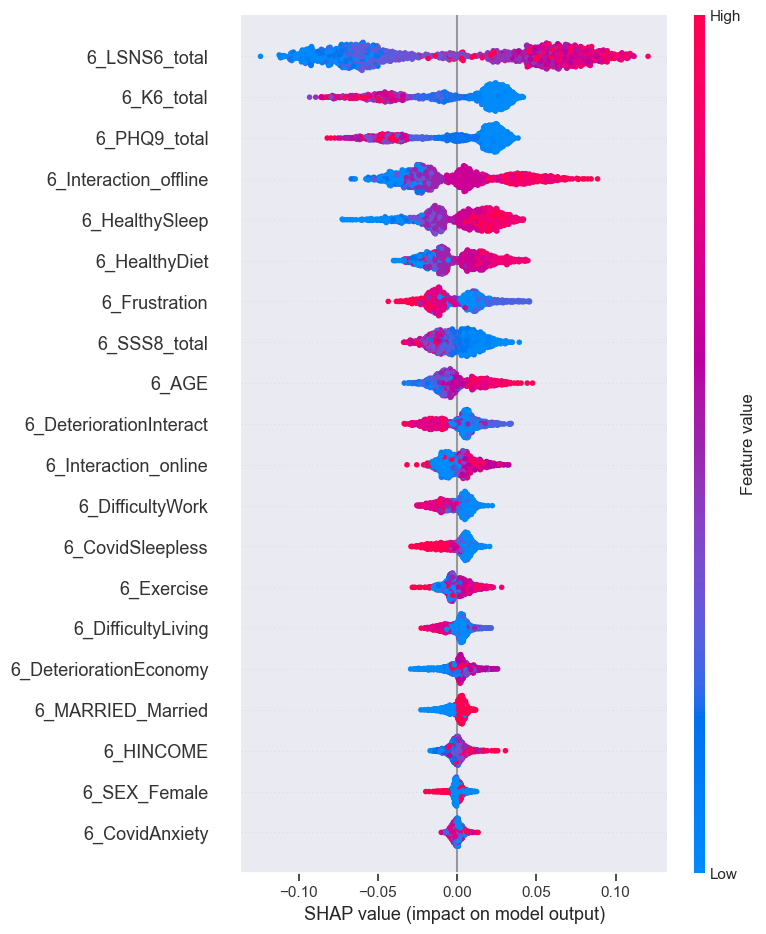

SHAP summary plot for class: Moderate


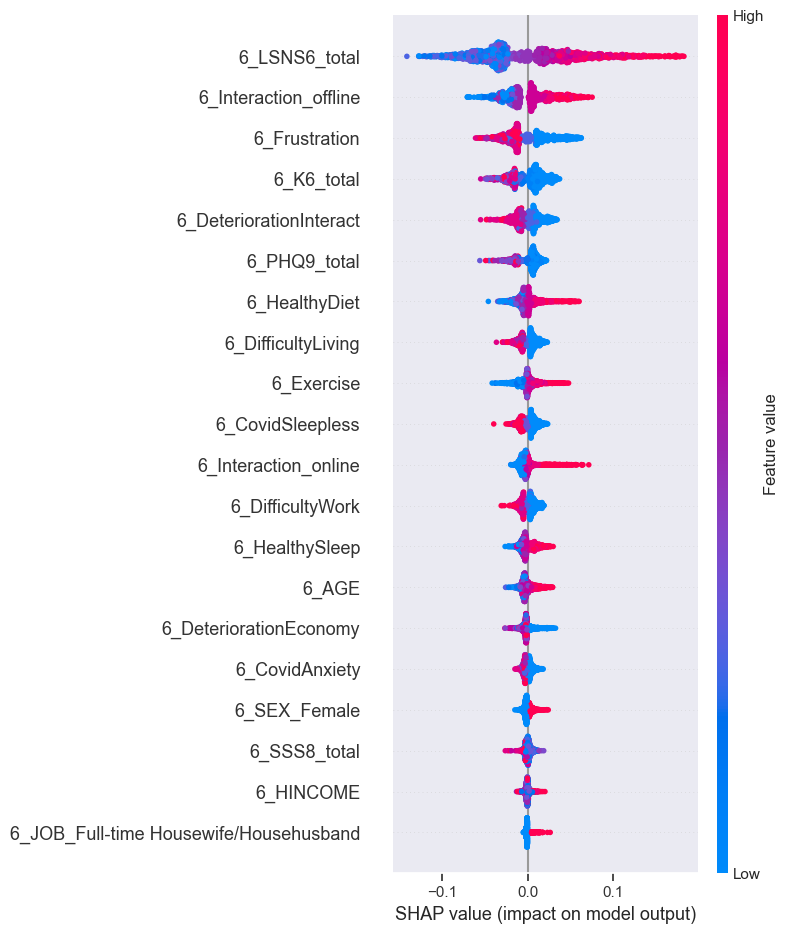

SHAP summary plot for class: Moderately high


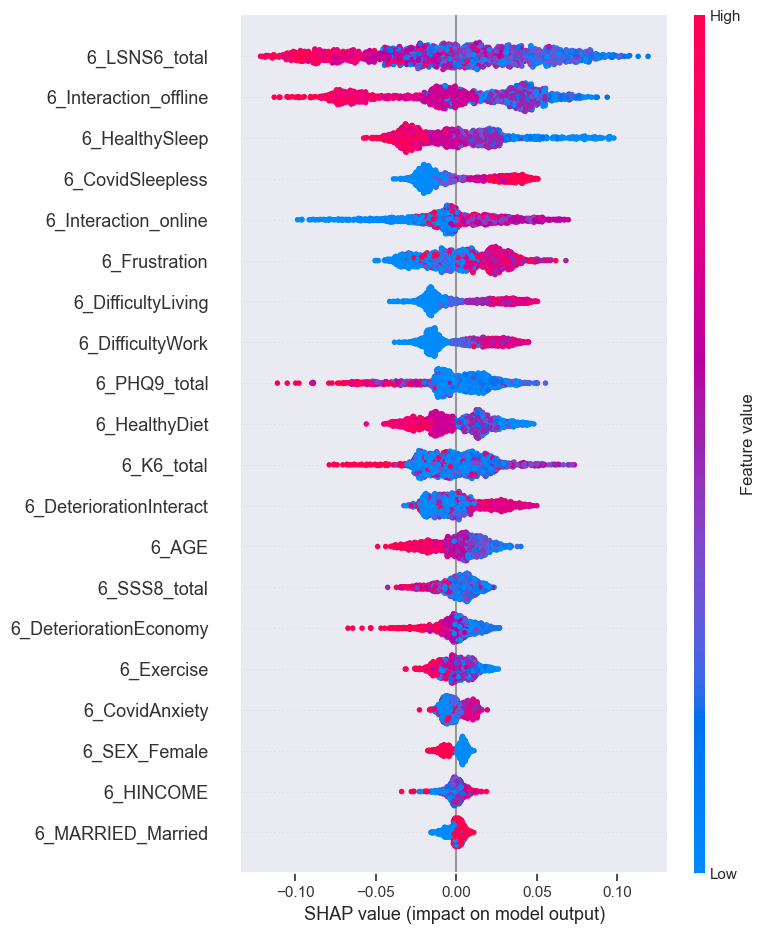

SHAP summary plot for class: High


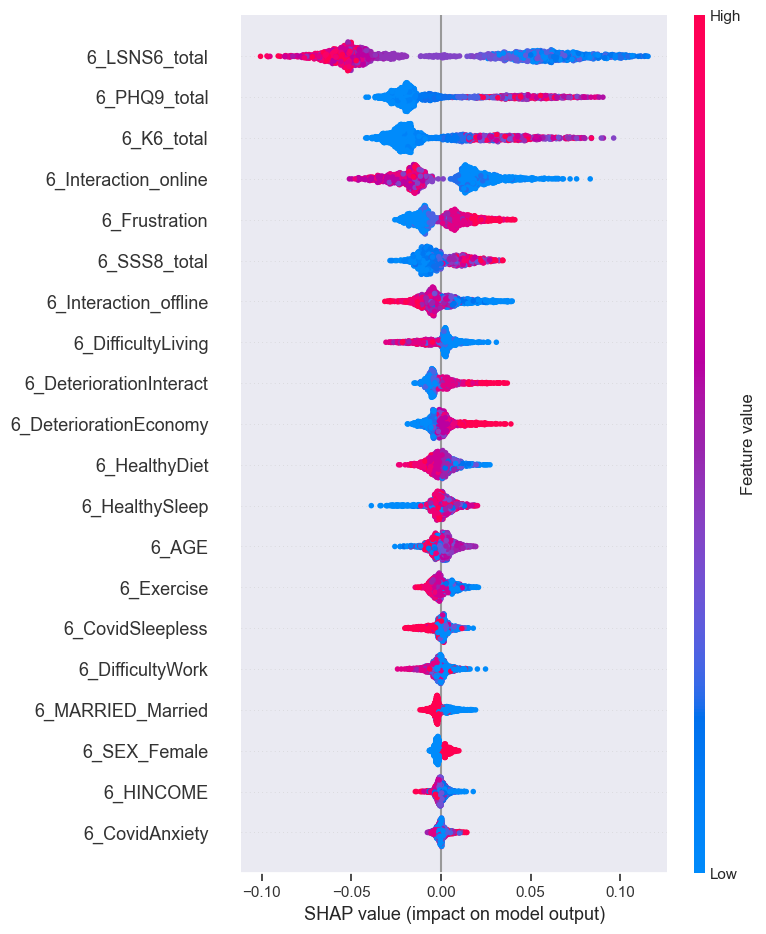

In [72]:
# Feature Effects
for i, class_name in enumerate(class_names):
    print(f"SHAP summary plot for class: {class_name}")
    shap.summary_plot(shap_values[:, :, i], X_train, feature_names=features_list)

In [72]:
# Dependence
print('Interaction values')
shap_interaction_values = explainer.shap_interaction_values(X_test)
print(shap_interaction_values)

Interaction values
[[[[-3.97178080e-03 -1.58865570e-03 -6.21599651e-04  3.54668501e-03
     2.63535115e-03]
   [-1.25832065e-04  3.80251728e-05  9.65016242e-05 -3.40828931e-04
     3.32134199e-04]
   [ 6.52298082e-05 -9.65755088e-05 -2.24215693e-04  6.80441219e-04
    -4.24879826e-04]
   ...
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
     0.00000000e+00]
   [ 3.78314918e-06 -2.48406471e-06 -8.34382853e-08 -3.11626490e-06
     1.90061872e-06]
   [ 2.35255813e-06 -5.13199687e-04 -2.42633148e-05  2.23879517e-04
     3.11230927e-04]]

  [[-1.25832065e-04  3.80251728e-05  9.65016242e-05 -3.40828931e-04
     3.32134199e-04]
   [ 2.34546889e-03 -3.13001613e-03 -1.19722314e-04 -3.36528319e-04
     1.24079787e-03]
   [-1.17312046e-05 -1.08374194e-04  1.81790365e-04  2.26305243e-04
    -2.87990209e-04]
   ...
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
     0.00000000e+00]
   [ 3.68559690e-08 -1.14635532e-07 -2.55766653e-07  4.18023667e-07
    -8.

In [74]:
# Define a path for the interaction values
shap_interaction_values_test_path = "shap_interaction_values_test.pkl"

In [80]:
# Save the SHAP interaction values for the test data
with open(shap_interaction_values_test_path, "wb") as f:
    pickle.dump(shap_interaction_values, f)

In [75]:
# Load the SHAP interaction values for the test data
with open(shap_interaction_values_test_path, "rb") as f:
    shap_interaction_values = pickle.load(f)

SHAP Dependence Plots (Minimal)


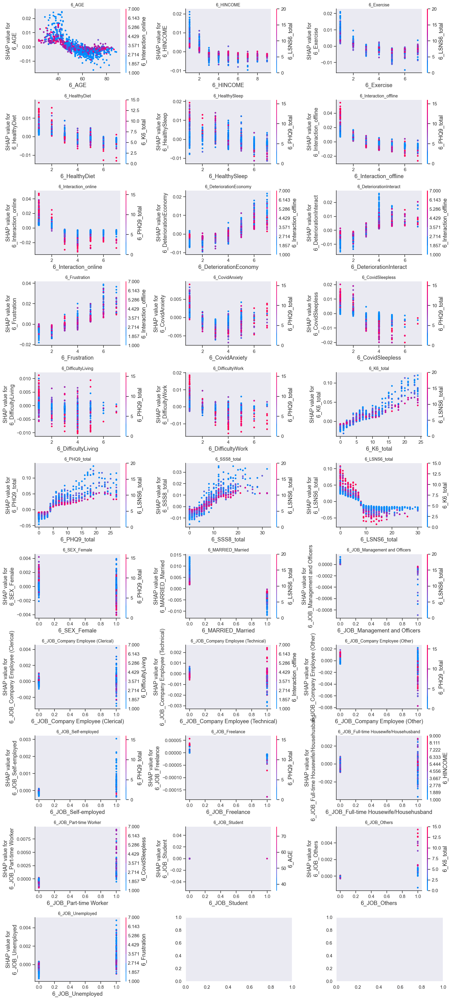

SHAP Dependence Plots (Low)


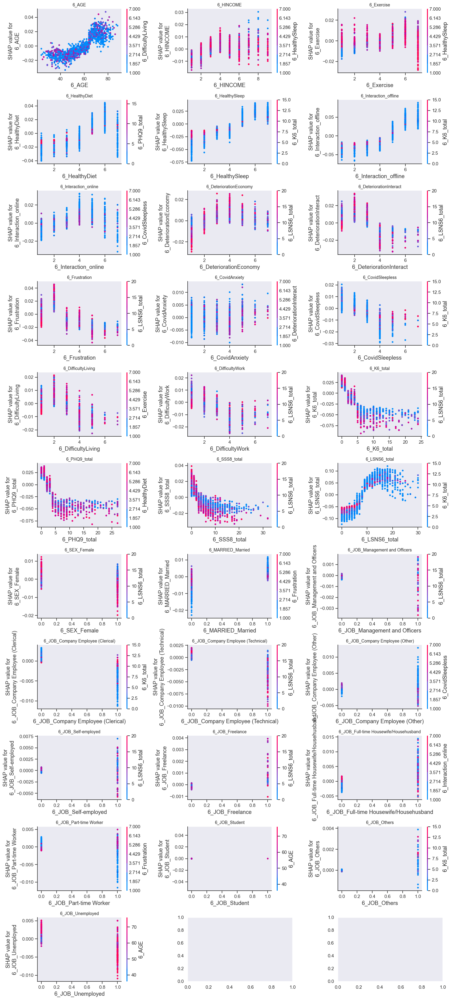

SHAP Dependence Plots (Moderate)


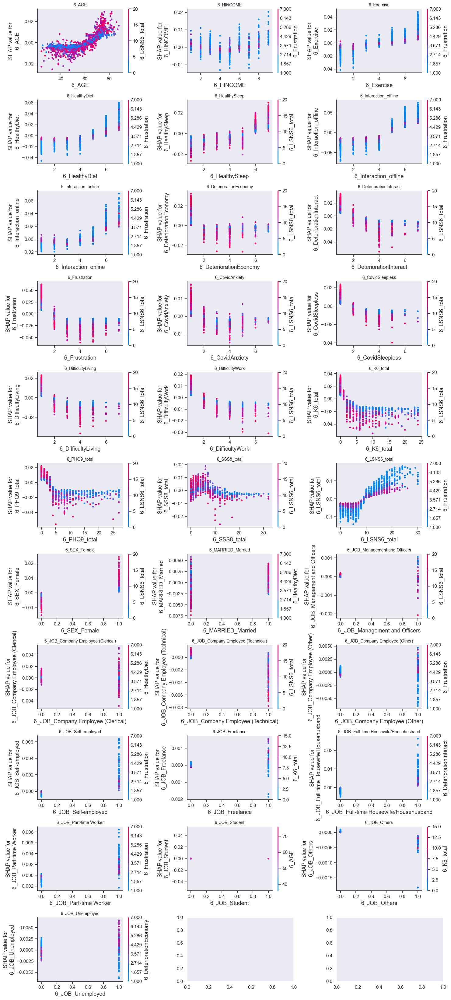

SHAP Dependence Plots (Moderately high)


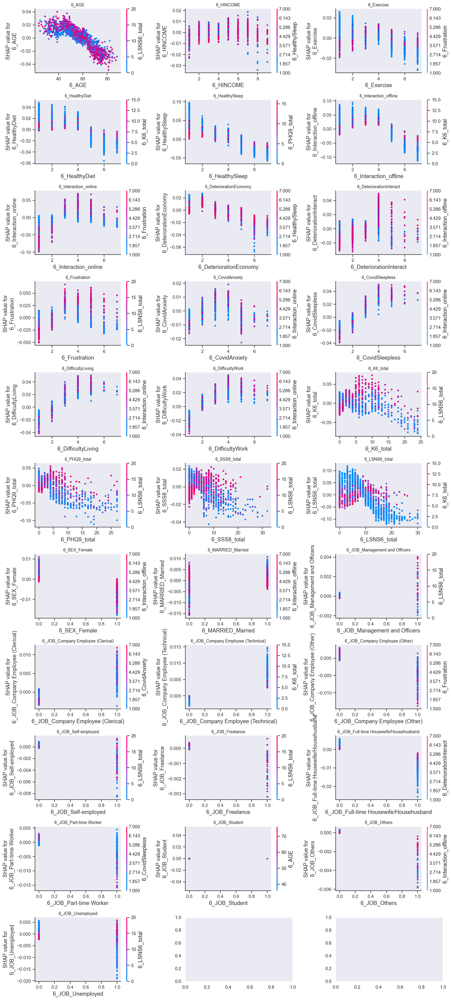

SHAP Dependence Plots (High)


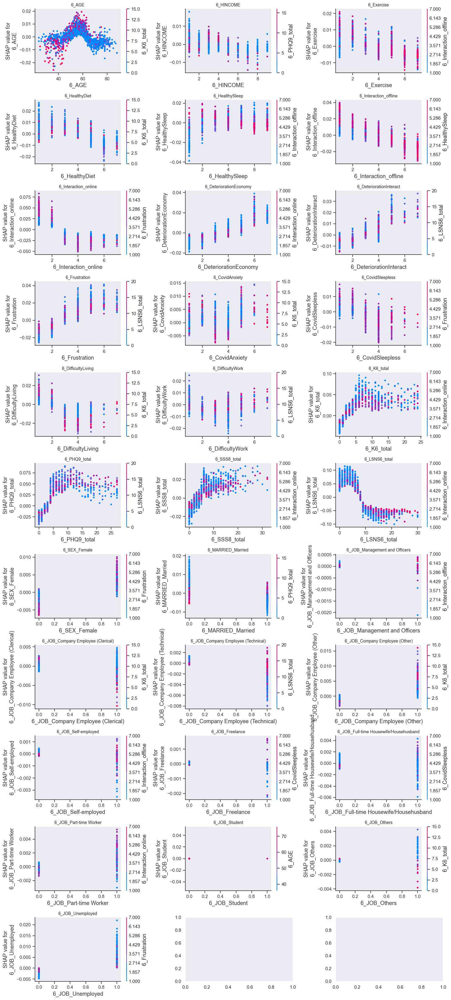

In [77]:
import matplotlib.pyplot as plt
import shap

# Define number of rows and columns for the grid
n_features = len(features_list)
n_cols = min(n_features, 3)  # Adjust column count for better spacing
n_rows = (n_features + n_cols - 1) // n_cols  # Calculate required rows

# Loop over each class to create separate figures
for class_idx, class_name in enumerate(class_names):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 3))
    axes = axes.flatten()  # Flatten for easy indexing

    for idx, ft in enumerate(features_list):
        shap.dependence_plot(
            ft, shap_values[:, :, class_idx], X_train, ax=axes[idx], show=False
        )
        axes[idx].set_title(f"{ft}", fontsize=10)  # Smaller font size

    # Adjust layout and show the figure for the current class
    print(f"SHAP Dependence Plots ({class_name})")
    plt.tight_layout()
    plt.show()


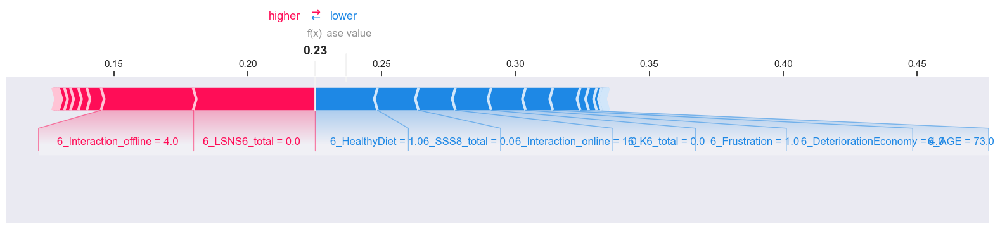

Sample: 6_AGE                                     55.0
6_HINCOME                                  4.0
6_Exercise                                 5.0
6_HealthyDiet                              2.0
6_HealthySleep                             5.0
6_Interaction_offline                      7.0
6_Interaction_online                       6.0
6_DeteriorationEconomy                     1.0
6_DeteriorationInteract                    1.0
6_Frustration                              4.0
6_CovidAnxiety                             1.0
6_CovidSleepless                           1.0
6_DifficultyLiving                         1.0
6_DifficultyWork                           1.0
6_K6_total                                 3.0
6_PHQ9_total                               3.0
6_SSS8_total                              11.0
6_LSNS6_total                             19.0
6_SEX_Female                               1.0
6_MARRIED_Married                          0.0
6_JOB_Management and Officers              0.0
6_JOB

In [94]:
# Additive Force
# Set sample index
i = 664  # Sample index

# Plot the force plot for the i-th sample and the second class
shap.force_plot(
    explainer.expected_value[1],  # Expected value for the second class
    shap_values[i, :, 1],         # SHAP values for the i-th sample, second class
    X_test.iloc[i],                # Features of the i-th sample
    feature_names=features_list,
    matplotlib=True
)

# Print sample details and SHAP values
print("Sample:", X_train.iloc[i])
print("\nSHAP Expected value for second class: %.2f" % explainer.expected_value[1])
print("Actual value: " + class_names[y_train[i]])

# Extract the predicted value safely
predicted_value = tuned_model.predict(pd.DataFrame(X_train.iloc[i]).T)[0]  # Extract the first element
print("Predicted value: " + class_names[predicted_value])


In [ ]:
# https://github.com/interpretml/DiCE/blob/main/docs/source/notebooks/DiCE_getting_started.ipynb

In [ ]:
# Sklearn imports
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier

# DiCE imports
import dice_ml
from dice_ml.utils import helpers  # helper functions